📁 Dataset path: /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed
📁 Output path: /kaggle/working

🔍 PART 1: orchid_processed STRUCTURE
----------------------------------------------------------------------
 Name      Type  Files      Details
 test Directory      0 Class folder
train Directory      0 Class folder
  val Directory      0 Class folder

📊 PART 2: IMAGE COUNT ANALYSIS
----------------------------------------------------------------------

📂 orchid_processed/train/
   ├── 📂 mdoscc/ → 2,699 images
   │   ├── 📄 o-3-00-01-002.png
   │   ├── 📄 o-3-00-01-004.png
   │   ├── 📄 o-3-00-01-005.png
   │   └── ... and 2696 more
   ├── 📂 normal/ → 1,045 images
   │   ├── 📄 o-0-00-01-002.png
   │   ├── 📄 o-0-00-01-003.png
   │   ├── 📄 o-0-00-01-004.png
   │   └── ... and 1042 more
   ├── 📂 osmf/ → 2,095 images
   │   ├── 📄 o-1-00-01-001.png
   │   ├── 📄 o-1-00-01-003.png
   │   ├── 📄 o-1-00-01-004.png
   │   └── ... and 2092 more
   ├── 📂 pdoscc/ → 1,599 images
 

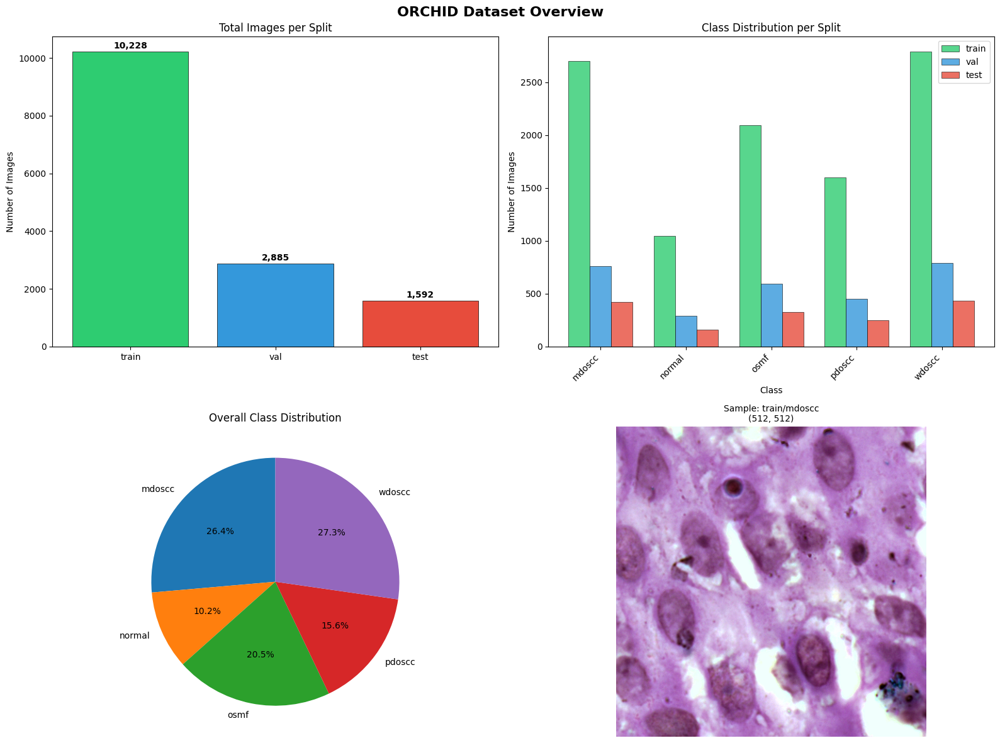

✅ Visualization saved to /kaggle/working/orchid_overview.png

📊 PART 5: IMAGE SIZE ANALYSIS
----------------------------------------------------------------------

   train (sampled 20 images):
      Width:  min=512, max=512, avg=512
      Height: min=512, max=512, avg=512
      Unique sizes: 1

   val (sampled 20 images):
      Width:  min=512, max=512, avg=512
      Height: min=512, max=512, avg=512
      Unique sizes: 1

   test (sampled 20 images):
      Width:  min=512, max=512, avg=512
      Height: min=512, max=512, avg=512
      Unique sizes: 1

💾 PART 6: EXPORTING STRUCTURE TO JSON
----------------------------------------------------------------------
✅ Structure saved to /kaggle/working/orchid_structure.json

🎉 EXPLORATION COMPLETE!


In [9]:
import os
import pandas as pd
import json
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# ============================================================
# EXACT PATHS FOR YOUR KAGGLE DATASET
# ============================================================

BASE_PATH = "/kaggle/input/datasets/mahrukh05/orchid-preprocessed-images"
DATASET_PATH = os.path.join(BASE_PATH, "orchid_processed")
OUTPUT_PATH = "/kaggle/working"

os.makedirs(OUTPUT_PATH, exist_ok=True)

print(f"📁 Dataset path: {DATASET_PATH}")
print(f"📁 Output path: {OUTPUT_PATH}")
print("=" * 70)

# Verify path exists
if not os.path.exists(DATASET_PATH):
    print(f"❌ ERROR: Path not found: {DATASET_PATH}")
    raise FileNotFoundError("Dataset path not found!")

# ============================================================
# PART 1: TOP-LEVEL STRUCTURE
# ============================================================
print("\n🔍 PART 1: orchid_processed STRUCTURE")
print("-" * 70)

top_level = []
for item in sorted(os.listdir(DATASET_PATH)):
    item_path = os.path.join(DATASET_PATH, item)
    if os.path.isdir(item_path):
        files = [f for f in os.listdir(item_path) if os.path.isfile(os.path.join(item_path, f))]
        top_level.append({
            'Name': item,
            'Type': 'Directory',
            'Files': len(files),
            'Details': f"Class folder"
        })

df_top = pd.DataFrame(top_level)
print(df_top.to_string(index=False))

# ============================================================
# PART 2: COUNT IMAGES PER SPLIT & CLASS
# ============================================================
print("\n📊 PART 2: IMAGE COUNT ANALYSIS")
print("-" * 70)

def count_images(path, extensions=('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp', '.webp')):
    """Count image files directly in a directory (non-recursive)"""
    if not os.path.exists(path):
        return 0
    return sum(1 for f in os.listdir(path) 
               if os.path.isfile(os.path.join(path, f)) and f.lower().endswith(extensions))

def get_all_images(path, extensions=('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp', '.webp')):
    """Get all image file paths recursively"""
    images = []
    for root, dirs, files in os.walk(path):
        for f in files:
            if f.lower().endswith(extensions):
                images.append(os.path.join(root, f))
    return images

splits = ['train', 'val', 'test']
split_stats = {}
summary_data = []
all_classes = set()

for split in splits:
    split_path = os.path.join(DATASET_PATH, split)
    if not os.path.exists(split_path):
        print(f"⚠️  {split}/ not found!")
        continue

    print(f"\n📂 orchid_processed/{split}/")
    split_stats[split] = {}

    classes = [d for d in sorted(os.listdir(split_path)) 
               if os.path.isdir(os.path.join(split_path, d))]

    for cls in classes:
        cls_path = os.path.join(split_path, cls)
        image_count = count_images(cls_path)
        split_stats[split][cls] = image_count
        all_classes.add(cls)

        # Show sample filenames
        sample_images = [f for f in sorted(os.listdir(cls_path)) 
                        if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp', '.webp'))]
        
        print(f"   ├── 📂 {cls}/ → {image_count:,} images")
        for s in sample_images[:3]:
            print(f"   │   ├── 📄 {s}")
        if len(sample_images) > 3:
            print(f"   │   └── ... and {len(sample_images) - 3} more")

# ============================================================
# PART 3: SUMMARY STATISTICS TABLE
# ============================================================
print("\n📈 PART 3: SUMMARY STATISTICS")
print("-" * 70)

display_classes = sorted(all_classes)

for split in splits:
    if split in split_stats:
        row = {'Split': split}
        total = 0
        for cls in display_classes:
            count = split_stats[split].get(cls, 0)
            row[cls] = count
            total += count
        row['Total'] = total
        summary_data.append(row)

df_summary = pd.DataFrame(summary_data)
print(df_summary.to_string(index=False))

grand_total = sum(row['Total'] for row in summary_data)
print(f"\n🎯 GRAND TOTAL: {grand_total:,} images")

# ============================================================
# PART 4: VISUALIZATION
# ============================================================
print("\n📊 PART 4: GENERATING VISUALIZATIONS")
print("-" * 70)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('ORCHID Dataset Overview', fontsize=16, fontweight='bold')

# Plot 1: Images per split
splits_names = [row['Split'] for row in summary_data]
splits_totals = [row['Total'] for row in summary_data]
colors = ['#2ecc71', '#3498db', '#e74c3c']
bars = axes[0, 0].bar(splits_names, splits_totals, color=colors, edgecolor='black', linewidth=0.5)
axes[0, 0].set_title('Total Images per Split')
axes[0, 0].set_ylabel('Number of Images')
for i, v in enumerate(splits_totals):
    axes[0, 0].text(i, v + max(splits_totals)*0.01, f"{v:,}", ha='center', fontweight='bold')

# Plot 2: Class distribution per split
x = np.arange(len(display_classes))
width = 0.25
colors = ['#2ecc71', '#3498db', '#e74c3c']

for idx, split in enumerate(splits):
    if split in split_stats:
        counts = [split_stats[split].get(cls, 0) for cls in display_classes]
        axes[0, 1].bar(x + width*(idx-1), counts, width, 
                      label=split, color=colors[idx], alpha=0.8, edgecolor='black', linewidth=0.5)

axes[0, 1].set_title('Class Distribution per Split')
axes[0, 1].set_xlabel('Class')
axes[0, 1].set_ylabel('Number of Images')
axes[0, 1].set_xticks(x)
axes[0, 1].set_xticklabels(display_classes, rotation=45, ha='right')
axes[0, 1].legend()

# Plot 3: Overall class distribution (pie chart)
overall_counts = [sum(split_stats[s].get(cls, 0) for s in splits if s in split_stats) 
                  for cls in display_classes]

axes[1, 0].pie(overall_counts, labels=display_classes, autopct='%1.1f%%', 
               startangle=90, textprops={'fontsize': 10})
axes[1, 0].set_title('Overall Class Distribution')

# Plot 4: Sample image
sample_found = False
for split in splits:
    split_path = os.path.join(DATASET_PATH, split)
    if not os.path.exists(split_path):
        continue
    classes = [d for d in sorted(os.listdir(split_path)) 
               if os.path.isdir(os.path.join(split_path, d))]
    for cls in classes:
        cls_path = os.path.join(split_path, cls)
        images = [f for f in sorted(os.listdir(cls_path)) 
                 if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp', '.webp'))]
        if images:
            img_path = os.path.join(cls_path, images[0])
            try:
                img = Image.open(img_path)
                axes[1, 1].imshow(img)
                axes[1, 1].set_title(f'Sample: {split}/{cls}\n{img.size}', fontsize=10)
                axes[1, 1].axis('off')
                sample_found = True
                break
            except Exception as e:
                print(f"⚠️ Could not open {img_path}: {e}")
    if sample_found:
        break

if not sample_found:
    axes[1, 1].text(0.5, 0.5, 'No sample images found', ha='center', va='center', transform=axes[1, 1].transAxes)
    axes[1, 1].set_title('Sample Image')

plt.tight_layout()
out_viz = os.path.join(OUTPUT_PATH, 'orchid_overview.png')
plt.savefig(out_viz, dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Visualization saved to {out_viz}")

# ============================================================
# PART 5: IMAGE SIZE ANALYSIS
# ============================================================
print("\n📊 PART 5: IMAGE SIZE ANALYSIS")
print("-" * 70)

for split in splits:
    split_path = os.path.join(DATASET_PATH, split)
    if not os.path.exists(split_path):
        continue

    images = get_all_images(split_path)
    sample = images[:min(20, len(images))]

    sizes = []
    for img_path in sample:
        try:
            img = Image.open(img_path)
            sizes.append(img.size)
        except:
            pass

    if sizes:
        widths = [s[0] for s in sizes]
        heights = [s[1] for s in sizes]
        print(f"\n   {split} (sampled {len(sizes)} images):")
        print(f"      Width:  min={min(widths)}, max={max(widths)}, avg={sum(widths)/len(widths):.0f}")
        print(f"      Height: min={min(heights)}, max={max(heights)}, avg={sum(heights)/len(heights):.0f}")
        print(f"      Unique sizes: {len(set(sizes))}")

# ============================================================
# PART 6: JSON EXPORT
# ============================================================
print("\n💾 PART 6: EXPORTING STRUCTURE TO JSON")
print("-" * 70)

structure_json = {
    'dataset_path': DATASET_PATH,
    'total_images': grand_total,
    'splits': {}
}

for split in splits:
    if split in split_stats:
        structure_json['splits'][split] = {
            'classes': split_stats[split],
            'total': sum(split_stats[split].values())
        }

out_json = os.path.join(OUTPUT_PATH, 'orchid_structure.json')
with open(out_json, 'w') as f:
    json.dump(structure_json, f, indent=2)

print(f"✅ Structure saved to {out_json}")
print("\n" + "=" * 70)
print("🎉 EXPLORATION COMPLETE!")
print("=" * 70)

In [10]:
# ============================================================
# ORCHID EXPERIMENT 1
# Kaggle Setup
# ============================================================

import os
import random
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets, transforms

import matplotlib.pyplot as plt
from PIL import Image

# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# ------------------------------------------------------------
# Device
# ------------------------------------------------------------

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Device: cuda
GPU: Tesla T4


In [11]:
import os

# ============================================================
# KAGGLE DATASET EXPLORER
# ============================================================

print("=" * 60)
print("📁 ALL DATASETS IN /kaggle/input/")
print("=" * 60)

# List all datasets in Kaggle input
input_path = "/kaggle/input"
if os.path.exists(input_path):
    datasets = [d for d in sorted(os.listdir(input_path)) 
                if os.path.isdir(os.path.join(input_path, d))]
    print(f"\nTotal datasets found: {len(datasets)}\n")
    for i, ds in enumerate(datasets, 1):
        ds_path = os.path.join(input_path, ds)
        # Count total files recursively
        total_files = sum(len(files) for _, _, files in os.walk(ds_path))
        print(f"{i}. 📂 {ds}/  →  {total_files:,} files")
else:
    print("❌ /kaggle/input not found!")

# ============================================================
# EXPLORE ORCHID DATASET SPECIFICALLY
# ============================================================

print("\n" + "=" * 60)
print("🌸 ORCHID DATASET DEEP DIVE")
print("=" * 60)

# Try common paths for the orchid dataset
possible_paths = [
    "/kaggle/input/orchid-preprocessed-images",
    "/kaggle/input/datasets/mahrukh05/orchid-preprocessed-images",
    "/kaggle/input/orchid",
]

# Auto-find the orchid dataset
ORCHID_ROOT = None
for p in possible_paths:
    if os.path.exists(p):
        ORCHID_ROOT = p
        print(f"\n✅ Found orchid dataset at: {p}")
        break

# If not found, search all datasets for 'orchid' in name
if ORCHID_ROOT is None:
    for ds in datasets:
        if "orchid" in ds.lower():
            ORCHID_ROOT = os.path.join(input_path, ds)
            print(f"\n✅ Found orchid dataset at: {ORCHID_ROOT}")
            break

if ORCHID_ROOT is None:
    print("\n❌ Orchid dataset not found! Check the dataset name in Kaggle.")
else:
    # Show full tree structure
    print("\n📂 FULL FOLDER TREE:")
    for root, dirs, files in os.walk(ORCHID_ROOT):
        level = root.replace(ORCHID_ROOT, '').count(os.sep)
        indent = '    ' * level
        folder_name = os.path.basename(root)
        print(f"{indent}📁 {folder_name}/")
        subindent = '    ' * (level + 1)
        for f in sorted(files)[:5]:  # Show first 5 files
            size = os.path.getsize(os.path.join(root, f))
            print(f"{subindent}📄 {f} ({size/1024:.1f} KB)")
        if len(files) > 5:
            print(f"{subindent}... and {len(files)-5} more files")

    # Count images in orchid_processed
    PROCESSED_PATH = os.path.join(ORCHID_ROOT, "orchid_processed")
    
    if os.path.exists(PROCESSED_PATH):
        print(f"\n{'='*60}")
        print("📊 IMAGE COUNT IN orchid_processed/")
        print(f"{'='*60}")
        
        img_extensions = ('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp', '.webp')
        total_images = 0
        
        for split in ['train', 'val', 'test']:
            split_path = os.path.join(PROCESSED_PATH, split)
            if not os.path.exists(split_path):
                print(f"\n⚠️  {split}/ not found")
                continue
                
            print(f"\n📂 {split}/")
            split_total = 0
            
            # List class folders
            classes = [d for d in sorted(os.listdir(split_path)) 
                      if os.path.isdir(os.path.join(split_path, d))]
            
            for cls in classes:
                cls_path = os.path.join(split_path, cls)
                # Count images in this class (recursively through patient folders)
                cls_images = 0
                patient_count = 0
                for patient_root, _, patient_files in os.walk(cls_path):
                    for f in patient_files:
                        if f.lower().endswith(img_extensions):
                            cls_images += 1
                    # Count patient folders (one level below class)
                    rel = os.path.relpath(patient_root, cls_path)
                    if rel != '.' and os.sep not in rel:
                        patient_count += 1
                
                print(f"   ├── {cls}: {cls_images:,} images ({patient_count} patients)")
                split_total += cls_images
            
            print(f"   └── SPLIT TOTAL: {split_total:,} images")
            total_images += split_total
        
        print(f"\n{'='*60}")
        print(f"🎯 GRAND TOTAL: {total_images:,} images")
        print(f"{'='*60}")
    else:
        print(f"\n❌ orchid_processed/ not found inside {ORCHID_ROOT}")

📁 ALL DATASETS IN /kaggle/input/

Total datasets found: 1

1. 📂 datasets/  →  29,485 files

🌸 ORCHID DATASET DEEP DIVE

✅ Found orchid dataset at: /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images

📂 FULL FOLDER TREE:
📁 orchid-preprocessed-images/
    📄 orchid_overview.png (1427.2 KB)
    📄 orchid_structure.json (0.7 KB)
    📁 orchid_reports/
        📄 final_report.json (2.2 KB)
        📄 final_report.txt (2.4 KB)
        📄 image_statistics.csv (115.1 KB)
        📄 metrics_test.csv (384.4 KB)
        📄 metrics_train.csv (2498.9 KB)
        ... and 1 more files
    📁 orchid_processed/
        📁 val/
            📁 mdoscc/
                📄 o-3-00-01-001.png (383.1 KB)
                📄 o-3-00-01-003.png (395.8 KB)
                📄 o-3-00-01-017.png (404.8 KB)
                📄 o-3-00-01-022.png (428.8 KB)
                📄 o-3-00-01-030.png (397.7 KB)
                ... and 755 more files
            📁 normal/
                📄 o-0-00-01-020.png (437.6 KB)
                📄 o

In [12]:
# ============================================================
# ORCHID DATASET PATHS
# ============================================================

BASE_PATH = "/kaggle/input/datasets/mahrukh05/orchid-preprocessed-images"

DATASET_PATH = os.path.join(
    BASE_PATH,
    "orchid_processed"
)

OUTPUT_PATH = "/kaggle/working"

TRAIN_DIR = os.path.join(DATASET_PATH, "train")
VAL_DIR   = os.path.join(DATASET_PATH, "val")
TEST_DIR  = os.path.join(DATASET_PATH, "test")

print("Dataset path:", DATASET_PATH)
print("Train path:", TRAIN_DIR)
print("Validation path:", VAL_DIR)
print("Test path:", TEST_DIR)

Dataset path: /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed
Train path: /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed/train
Validation path: /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed/val
Test path: /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed/test


In [13]:
# ============================================================
# VERIFY ORCHID DIRECTORIES
# ============================================================

for path in [TRAIN_DIR, VAL_DIR, TEST_DIR]:

    print("\n", path)
    print("Exists:", os.path.exists(path))

    if os.path.exists(path):
        print("Contents:", os.listdir(path))


 /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed/train
Exists: True
Contents: ['mdoscc', 'normal', 'osmf', 'pdoscc', 'wdoscc']

 /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed/val
Exists: True
Contents: ['mdoscc', 'normal', 'osmf', 'pdoscc', 'wdoscc']

 /kaggle/input/datasets/mahrukh05/orchid-preprocessed-images/orchid_processed/test
Exists: True
Contents: ['mdoscc', 'normal', 'osmf', 'pdoscc', 'wdoscc']


In [14]:
# ============================================================
# CHECK IMAGE COUNTS
# ============================================================

for split_name, split_path in [
    ("TRAIN", TRAIN_DIR),
    ("VAL", VAL_DIR),
    ("TEST", TEST_DIR)
]:

    print(f"\n{'='*50}")
    print(split_name)
    print(f"{'='*50}")

    for class_name in sorted(os.listdir(split_path)):

        class_path = os.path.join(
            split_path,
            class_name
        )

        if os.path.isdir(class_path):

            count = len([
                f for f in os.listdir(class_path)
                if f.lower().endswith(
                    (".png", ".jpg", ".jpeg")
                )
            ])

            print(f"{class_name:10s} : {count}")


TRAIN
mdoscc     : 2699
normal     : 1045
osmf       : 2095
pdoscc     : 1599
wdoscc     : 2790

VAL
mdoscc     : 760
normal     : 294
osmf       : 592
pdoscc     : 451
wdoscc     : 788

TEST
mdoscc     : 421
normal     : 163
osmf       : 328
pdoscc     : 247
wdoscc     : 433


In [15]:
import torchvision
from torchvision import datasets

temp_dataset = datasets.ImageFolder(TRAIN_DIR)

print("Class names:")
print(temp_dataset.classes)

print("\nClass mapping:")
print(temp_dataset.class_to_idx)

Class names:
['mdoscc', 'normal', 'osmf', 'pdoscc', 'wdoscc']

Class mapping:
{'mdoscc': 0, 'normal': 1, 'osmf': 2, 'pdoscc': 3, 'wdoscc': 4}


In [16]:
# ============================================================
# Human-readable class names
# ============================================================

CLASS_DISPLAY_NAMES = {
    "mdoscc": "MDOSCC",
    "normal": "Normal",
    "osmf": "OSMF",
    "pdoscc": "PDOSCC",
    "wdoscc": "WDOSCC"
}

idx_to_class = {
    idx: CLASS_DISPLAY_NAMES[class_name]
    for class_name, idx in temp_dataset.class_to_idx.items()
}

print(idx_to_class)

{0: 'MDOSCC', 1: 'Normal', 2: 'OSMF', 3: 'PDOSCC', 4: 'WDOSCC'}


In [17]:
from torchvision import transforms

# ============================================================
# Transforms
# ============================================================

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    
    transforms.ToTensor(),
    
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    
    transforms.ToTensor(),
    
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [18]:
# ============================================================
# Load ORCHID datasets
# ============================================================

train_dataset = datasets.ImageFolder(
    TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    VAL_DIR,
    transform=val_test_transform
)

test_dataset = datasets.ImageFolder(
    TEST_DIR,
    transform=val_test_transform
)

print("Train:", len(train_dataset))
print("Val:", len(val_dataset))
print("Test:", len(test_dataset))

print("\nClasses:", train_dataset.classes)
print("Mapping:", train_dataset.class_to_idx)

Train: 10228
Val: 2885
Test: 1592

Classes: ['mdoscc', 'normal', 'osmf', 'pdoscc', 'wdoscc']
Mapping: {'mdoscc': 0, 'normal': 1, 'osmf': 2, 'pdoscc': 3, 'wdoscc': 4}


In [19]:
assert train_dataset.class_to_idx == val_dataset.class_to_idx
assert train_dataset.class_to_idx == test_dataset.class_to_idx

print("✓ Class mappings are identical across train/val/test")

✓ Class mappings are identical across train/val/test


In [20]:
# ============================================================
# Class distribution
# ============================================================

from collections import Counter

train_counts = Counter(
    label for _, label in train_dataset.samples
)

val_counts = Counter(
    label for _, label in val_dataset.samples
)

test_counts = Counter(
    label for _, label in test_dataset.samples
)

print("TRAIN")
for idx, count in sorted(train_counts.items()):
    print(idx_to_class[idx], ":", count)

print("\nVALIDATION")
for idx, count in sorted(val_counts.items()):
    print(idx_to_class[idx], ":", count)

print("\nTEST")
for idx, count in sorted(test_counts.items()):
    print(idx_to_class[idx], ":", count)

TRAIN
MDOSCC : 2699
Normal : 1045
OSMF : 2095
PDOSCC : 1599
WDOSCC : 2790

VALIDATION
MDOSCC : 760
Normal : 294
OSMF : 592
PDOSCC : 451
WDOSCC : 788

TEST
MDOSCC : 421
Normal : 163
OSMF : 328
PDOSCC : 247
WDOSCC : 433


In [21]:
# ============================================================
# Calculate class weights
# ============================================================

num_classes = len(train_dataset.classes)
total_samples = len(train_dataset)

class_weights = []

for class_idx in range(num_classes):

    count = train_counts[class_idx]

    weight = total_samples / (
        num_classes * count
    )

    class_weights.append(weight)

class_weights = torch.tensor(
    class_weights,
    dtype=torch.float32
)

print("Class weights:")

for idx, weight in enumerate(class_weights):
    print(
        f"{idx_to_class[idx]:10s} -> {weight:.4f}"
    )

Class weights:
MDOSCC     -> 0.7579
Normal     -> 1.9575
OSMF       -> 0.9764
PDOSCC     -> 1.2793
WDOSCC     -> 0.7332


In [24]:
# ============================================================
# ORCHID Model Configuration
# ============================================================

class CFG:

    NUM_CLASSES = 5

    IMG_SIZE = 224

    BATCH_SIZE = 32

    NUM_HEADS = 8

    DEVICE = device

In [26]:
# ============================================================
# DataLoaders
# ============================================================

train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train batches: 320
Val batches: 91
Test batches: 50


In [27]:
# ============================================================
# Check batch
# ============================================================

images, labels = next(iter(train_loader))

print("Image shape:", images.shape)
print("Labels shape:", labels.shape)
print("Labels:", labels[:10])

Image shape: torch.Size([32, 3, 224, 224])
Labels shape: torch.Size([32])
Labels: tensor([0, 4, 3, 2, 4, 3, 0, 2, 2, 0])


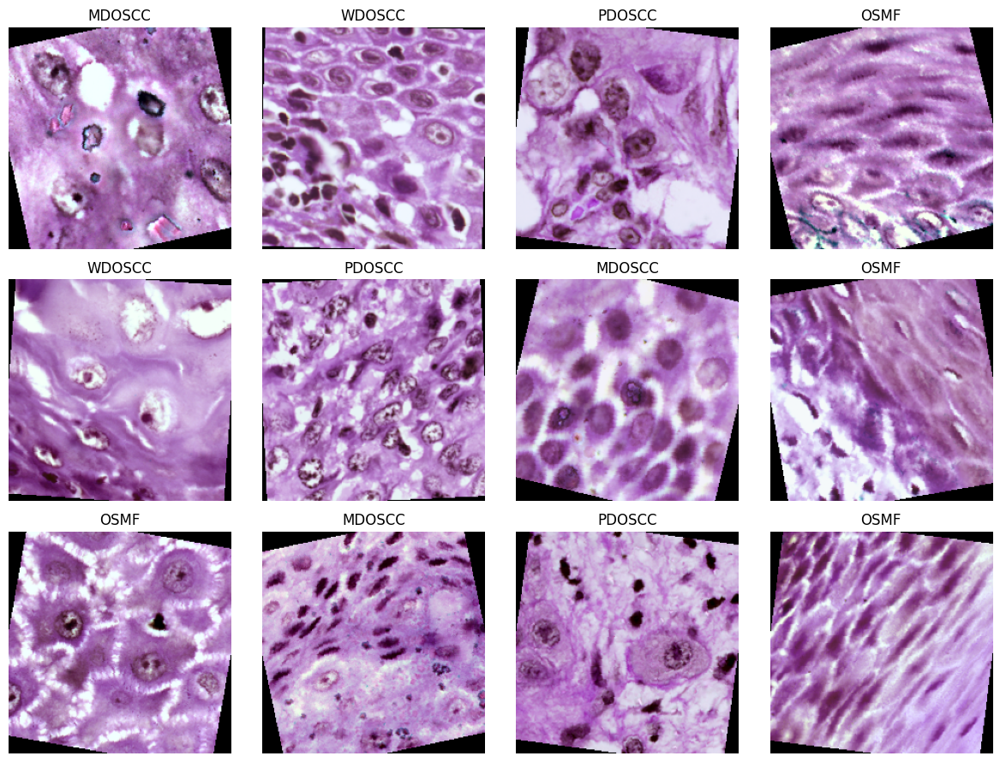

In [28]:
# ============================================================
# Visualize training batch
# ============================================================

def denormalize(image):

    mean = torch.tensor(
        [0.485, 0.456, 0.406]
    ).view(3, 1, 1)

    std = torch.tensor(
        [0.229, 0.224, 0.225]
    ).view(3, 1, 1)

    image = image * std + mean

    return torch.clamp(image, 0, 1)


fig, axes = plt.subplots(
    3, 4,
    figsize=(12, 9)
)

for ax, image, label in zip(
    axes.flatten(),
    images[:12],
    labels[:12]
):

    image = denormalize(image)

    ax.imshow(
        image.permute(1, 2, 0)
    )

    ax.set_title(
        idx_to_class[label.item()]
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [29]:
print(train_dataset.class_to_idx)

{'mdoscc': 0, 'normal': 1, 'osmf': 2, 'pdoscc': 3, 'wdoscc': 4}


In [82]:
CLIP_PROMPTS = {
    "mdoscc": [
        "a histopathological image of moderately differentiated oral squamous cell carcinoma",
        "a microscopic image of moderately differentiated oral squamous cell carcinoma",
        "a histology slide showing moderately differentiated OSCC",
        "moderately differentiated oral squamous cell carcinoma under a microscope",
        "a pathology image of moderately differentiated oral cancer",
        "oral squamous cell carcinoma with moderate differentiation",
    ],

    "normal": [
        "a histopathological image of normal oral tissue",
        "a microscopic image of normal oral mucosa",
        "a histology image showing healthy oral tissue",
        "a pathology slide of normal oral mucosa",
        "a microscopic view of healthy oral epithelium",
        "normal oral tissue under a microscope",
    ],

    "osmf": [
        "a histopathological image of oral submucous fibrosis",
        "a microscopic image showing oral submucous fibrosis",
        "a histology slide of oral submucous fibrosis",
        "oral mucosa affected by oral submucous fibrosis",
        "a pathology image showing fibrosis of the oral mucosa",
        "a microscopic view of fibrotic oral tissue",
    ],

    "pdoscc": [
        "a histopathological image of poorly differentiated oral squamous cell carcinoma",
        "a microscopic image of poorly differentiated oral squamous cell carcinoma",
        "a histology slide showing poorly differentiated OSCC",
        "poorly differentiated oral squamous cell carcinoma under a microscope",
        "a pathology image of poorly differentiated oral cancer",
        "oral squamous cell carcinoma with poor differentiation",
    ],

    "wdoscc": [
        "a histopathological image of well differentiated oral squamous cell carcinoma",
        "a microscopic image of well differentiated oral squamous cell carcinoma",
        "a histology slide showing well differentiated OSCC",
        "well differentiated oral squamous cell carcinoma under a microscope",
        "a pathology image of well differentiated oral cancer",
        "oral squamous cell carcinoma with high differentiation",
    ]
}

In [83]:
# ============================================================
# Ordered CLIP prompts
# ============================================================

ordered_prompts = [
    CLIP_PROMPTS[class_name]
    for class_name in train_dataset.classes
]

for idx, prompt in enumerate(ordered_prompts):

    print(
        idx,
        "->",
        idx_to_class[idx],
        "->",
        prompt
    )

0 -> MDOSCC -> ['a histopathological image of moderately differentiated oral squamous cell carcinoma', 'a microscopic image of moderately differentiated oral squamous cell carcinoma', 'a histology slide showing moderately differentiated OSCC', 'moderately differentiated oral squamous cell carcinoma under a microscope', 'a pathology image of moderately differentiated oral cancer', 'oral squamous cell carcinoma with moderate differentiation']
1 -> Normal -> ['a histopathological image of normal oral tissue', 'a microscopic image of normal oral mucosa', 'a histology image showing healthy oral tissue', 'a pathology slide of normal oral mucosa', 'a microscopic view of healthy oral epithelium', 'normal oral tissue under a microscope']
2 -> OSMF -> ['a histopathological image of oral submucous fibrosis', 'a microscopic image showing oral submucous fibrosis', 'a histology slide of oral submucous fibrosis', 'oral mucosa affected by oral submucous fibrosis', 'a pathology image showing fibrosis o

In [32]:
import transformers

print("Transformers version:", transformers.__version__)

Transformers version: 5.0.0


In [33]:
!pip install -q open_clip_torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 51.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.6 MB/s eta 0:00:00


In [34]:
import open_clip

print("OpenCLIP version:", open_clip.__version__)

OpenCLIP version: 3.3.0


In [35]:
# ==========================================================
# Load Frozen CLIP Text Encoder
# ORCHID - Experiment 1
# ==========================================================

import open_clip

# ----------------------------------------------------------
# Load the SAME OpenCLIP model used in NDB-USE Experiment 1
# ----------------------------------------------------------

clip_model, _, clip_preprocess = open_clip.create_model_and_transforms(
    model_name="ViT-B-16",
    pretrained="laion2b_s34b_b88k",
    device=device
)

# ----------------------------------------------------------
# Freeze CLIP
# ----------------------------------------------------------

clip_model.eval()

for param in clip_model.parameters():
    param.requires_grad = False

print("✓ CLIP Loaded Successfully")
print("✓ CLIP is Frozen")
print("Model: ViT-B-16")
print("Pretrained: laion2b_s34b_b88k")

open_clip_model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

✓ CLIP Loaded Successfully
✓ CLIP is Frozen
Model: ViT-B-16
Pretrained: laion2b_s34b_b88k


In [36]:
# ==========================================================
# Generate Frozen CLIP Text Embeddings
# ORCHID - Experiment 1
# ==========================================================

# Get the tokenizer for the SAME OpenCLIP model
tokenizer = open_clip.get_tokenizer("ViT-B-16")

clip_text_features = {}

with torch.no_grad():

    for class_name in train_dataset.classes:

        prompts = CLIP_PROMPTS[class_name]

        # Tokenize prompts
        text_tokens = tokenizer(prompts).to(device)

        # Encode text using frozen CLIP text encoder
        text_features = clip_model.encode_text(
            text_tokens
        )

        # Normalize each prompt embedding
        text_features = F.normalize(
            text_features,
            dim=-1
        )

        # Average the 6 prompt embeddings
        class_embedding = text_features.mean(
            dim=0,
            keepdim=True
        )

        # Normalize the averaged embedding
        class_embedding = F.normalize(
            class_embedding,
            dim=-1
        )

        clip_text_features[class_name] = (
            class_embedding
        )

        print(
            f"{class_name:10s} -> "
            f"{class_embedding.shape}"
        )

mdoscc     -> torch.Size([1, 512])
normal     -> torch.Size([1, 512])
osmf       -> torch.Size([1, 512])
pdoscc     -> torch.Size([1, 512])
wdoscc     -> torch.Size([1, 512])


In [37]:
# ==========================================================
# Order CLIP embeddings according to ImageFolder mapping
# ==========================================================

ordered_text_features = torch.cat(
    [
        clip_text_features[class_name]
        for class_name in train_dataset.classes
    ],
    dim=0
)

print("Ordered CLIP features:")
print(ordered_text_features.shape)

print("\nClass order:")
for idx, class_name in enumerate(train_dataset.classes):
    print(idx, "->", class_name)

Ordered CLIP features:
torch.Size([5, 512])

Class order:
0 -> mdoscc
1 -> normal
2 -> osmf
3 -> pdoscc
4 -> wdoscc


In [38]:
# ==========================================================
# FIND NDB SWIN CHECKPOINT
# ==========================================================

import os

for root, dirs, files in os.walk("/kaggle/input"):
    for file in files:
        if file.endswith(".pth") or file.endswith(".pt"):
            print(os.path.join(root, file))

/kaggle/input/datasets/mahrukh05/ndb-pretrained-weights/best_stage1_swin.pth
/kaggle/input/datasets/mahrukh05/hybrid-stage-2/best_orchid_hybrid_stage2.pth
/kaggle/input/datasets/mahrukh05/hybrid-stage-1/best_orchid_hybrid_stage1 (3).pth
/kaggle/input/datasets/mahrukh05/orchid-swin-model/best_orchid_swin.pth


In [39]:
# ==========================================================
# Inspect NDB-trained Swin checkpoint
# ==========================================================

NDB_SWIN_CHECKPOINT = (
    "/kaggle/input/datasets/mahrukh05/"
    "ndb-pretrained-weights/best_stage1_swin.pth"
)

checkpoint = torch.load(
    NDB_SWIN_CHECKPOINT,
    map_location="cpu"
)

print("Checkpoint type:", type(checkpoint))

if isinstance(checkpoint, dict):
    print("\nCheckpoint keys:")
    print(checkpoint.keys())

Checkpoint type: <class 'collections.OrderedDict'>

Checkpoint keys:
odict_keys(['backbone.patch_embed.proj.weight', 'backbone.patch_embed.proj.bias', 'backbone.patch_embed.norm.weight', 'backbone.patch_embed.norm.bias', 'backbone.layers.0.blocks.0.norm1.weight', 'backbone.layers.0.blocks.0.norm1.bias', 'backbone.layers.0.blocks.0.attn.relative_position_bias_table', 'backbone.layers.0.blocks.0.attn.qkv.weight', 'backbone.layers.0.blocks.0.attn.qkv.bias', 'backbone.layers.0.blocks.0.attn.proj.weight', 'backbone.layers.0.blocks.0.attn.proj.bias', 'backbone.layers.0.blocks.0.norm2.weight', 'backbone.layers.0.blocks.0.norm2.bias', 'backbone.layers.0.blocks.0.mlp.fc1.weight', 'backbone.layers.0.blocks.0.mlp.fc1.bias', 'backbone.layers.0.blocks.0.mlp.fc2.weight', 'backbone.layers.0.blocks.0.mlp.fc2.bias', 'backbone.layers.0.blocks.1.norm1.weight', 'backbone.layers.0.blocks.1.norm1.bias', 'backbone.layers.0.blocks.1.attn.relative_position_bias_table', 'backbone.layers.0.blocks.1.attn.qkv.weig

In [40]:
# ==========================================================
# NDB Swin Checkpoint Path
# ==========================================================

NDB_SWIN_CHECKPOINT = (
    "/kaggle/input/datasets/mahrukh05/"
    "ndb-pretrained-weights/best_stage1_swin.pth"
)

print("Checkpoint exists:", os.path.exists(NDB_SWIN_CHECKPOINT))
print("Checkpoint path:", NDB_SWIN_CHECKPOINT)

Checkpoint exists: True
Checkpoint path: /kaggle/input/datasets/mahrukh05/ndb-pretrained-weights/best_stage1_swin.pth


In [41]:
# ==========================================================
# Inspect NDB Swin checkpoint
# ==========================================================

checkpoint = torch.load(
    NDB_SWIN_CHECKPOINT,
    map_location="cpu"
)

print("Checkpoint type:", type(checkpoint))

if isinstance(checkpoint, dict):
    print("\nCheckpoint keys:")
    print(checkpoint.keys())

Checkpoint type: <class 'collections.OrderedDict'>

Checkpoint keys:
odict_keys(['backbone.patch_embed.proj.weight', 'backbone.patch_embed.proj.bias', 'backbone.patch_embed.norm.weight', 'backbone.patch_embed.norm.bias', 'backbone.layers.0.blocks.0.norm1.weight', 'backbone.layers.0.blocks.0.norm1.bias', 'backbone.layers.0.blocks.0.attn.relative_position_bias_table', 'backbone.layers.0.blocks.0.attn.qkv.weight', 'backbone.layers.0.blocks.0.attn.qkv.bias', 'backbone.layers.0.blocks.0.attn.proj.weight', 'backbone.layers.0.blocks.0.attn.proj.bias', 'backbone.layers.0.blocks.0.norm2.weight', 'backbone.layers.0.blocks.0.norm2.bias', 'backbone.layers.0.blocks.0.mlp.fc1.weight', 'backbone.layers.0.blocks.0.mlp.fc1.bias', 'backbone.layers.0.blocks.0.mlp.fc2.weight', 'backbone.layers.0.blocks.0.mlp.fc2.bias', 'backbone.layers.0.blocks.1.norm1.weight', 'backbone.layers.0.blocks.1.norm1.bias', 'backbone.layers.0.blocks.1.attn.relative_position_bias_table', 'backbone.layers.0.blocks.1.attn.qkv.weig

In [42]:
# ==========================================================
# ORCHID Swin
# Initialized with ImageNet-pretrained Swin architecture
# NDB-trained backbone weights will be loaded next
# ==========================================================

import timm
import torch
import torch.nn as nn


class OralCancerSwin(nn.Module):

    def __init__(self, num_classes=5):

        super().__init__()

        # --------------------------------------------------
        # Swin Tiny Backbone
        # --------------------------------------------------

        self.backbone = timm.create_model(
            "swin_tiny_patch4_window7_224",
            pretrained=True,
            num_classes=0
        )

        feature_dim = self.backbone.num_features

        # --------------------------------------------------
        # NEW ORCHID 5-Class Classification Head
        # --------------------------------------------------

        self.classifier = ClassificationHead(
            in_features=feature_dim,
            hidden_features=512,
            num_classes=num_classes,
            dropout=CFG.DROP_RATE
        )

    def forward(self, x):

        features = self.backbone(x)

        logits = self.classifier(features)

        return logits

In [43]:
# ==========================================================
# Create Swin-Tiny Backbone for ORCHID
# ==========================================================

import timm
import torch

orchid_swin_backbone = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=0
).to(device)

print("✓ Swin-Tiny backbone created")
print("Feature dimension:", orchid_swin_backbone.num_features)

model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

✓ Swin-Tiny backbone created
Feature dimension: 768


In [48]:
# ==========================================================
# Load NDB Swin Checkpoint
# ==========================================================

checkpoint = torch.load(
    NDB_SWIN_CHECKPOINT,
    map_location="cpu"
)

print("Checkpoint type:", type(checkpoint))
print("Number of parameters:", len(checkpoint))

Checkpoint type: <class 'collections.OrderedDict'>
Number of parameters: 175


In [49]:
# ==========================================================
# Extract NDB-trained Swin Backbone Weights
# ==========================================================

ndb_backbone_state = {
    key.replace("backbone.", "", 1): value
    for key, value in checkpoint.items()
    if key.startswith("backbone.")
}

print("NDB backbone parameters:", len(ndb_backbone_state))
print("First few keys:")
for key in list(ndb_backbone_state.keys())[:10]:
    print(key)

NDB backbone parameters: 171
First few keys:
patch_embed.proj.weight
patch_embed.proj.bias
patch_embed.norm.weight
patch_embed.norm.bias
layers.0.blocks.0.norm1.weight
layers.0.blocks.0.norm1.bias
layers.0.blocks.0.attn.relative_position_bias_table
layers.0.blocks.0.attn.qkv.weight
layers.0.blocks.0.attn.qkv.bias
layers.0.blocks.0.attn.proj.weight


In [50]:
# ==========================================================
# Transfer NDB-trained Swin Weights
# ==========================================================

load_result = orchid_swin_backbone.load_state_dict(
    ndb_backbone_state,
    strict=True
)

print("✓ NDB-trained Swin backbone loaded successfully!")
print(load_result)

✓ NDB-trained Swin backbone loaded successfully!
<All keys matched successfully>


In [51]:
# ==========================================================
# Verify Swin Backbone
# ==========================================================

orchid_swin_backbone.eval()

dummy_input = torch.randn(
    2, 3, 224, 224,
    device=device
)

with torch.no_grad():
    dummy_features = orchid_swin_backbone(dummy_input)

print("Input shape :", dummy_input.shape)
print("Output shape:", dummy_features.shape)

Input shape : torch.Size([2, 3, 224, 224])
Output shape: torch.Size([2, 768])


In [52]:
# ==========================================================
# Classification Head
# ==========================================================

import torch
import torch.nn as nn


class ClassificationHead(nn.Module):

    def __init__(
        self,
        in_features=768,
        hidden_features=512,
        num_classes=3,
        dropout=0.30,
    ):

        super().__init__()

        self.head = nn.Sequential(

            nn.Dropout(dropout),

            nn.Linear(in_features, hidden_features),

            nn.GELU(),

            nn.Dropout(dropout),

            nn.Linear(hidden_features, num_classes)

        )

    def forward(self, x):

        return self.head(x)


print("✓ ClassificationHead defined")

✓ ClassificationHead defined


In [79]:
# ==========================================================
# ORCHID Classification Head
# ==========================================================

ORCHID_NUM_CLASSES = 5

orchid_classifier = ClassificationHead(
    in_features=768,
    hidden_features=512,
    num_classes=ORCHID_NUM_CLASSES,
    dropout=0.30
).to(device)

print("✓ ORCHID Classification Head Created")
print("Input features :", 768)
print("Hidden features:", 512)
print("Output classes :", ORCHID_NUM_CLASSES)

✓ ORCHID Classification Head Created
Input features : 768
Hidden features: 512
Output classes : 5


In [53]:
# ==========================================================
# ORCHID Swin Classifier
# NDB-trained Swin backbone + new 5-class head
# ==========================================================

class ORCHIDSwinClassifier(nn.Module):

    def __init__(self, backbone, num_classes=5):

        super().__init__()

        self.backbone = backbone

        self.classifier = ClassificationHead(
            in_features=backbone.num_features,
            hidden_features=512,
            num_classes=num_classes,
            dropout=0.30
        )

    def forward(self, x):

        features = self.backbone(x)

        logits = self.classifier(features)

        return logits

In [54]:
# ==========================================================
# Build ORCHID Swin
# ==========================================================

orchid_swin = ORCHIDSwinClassifier(
    backbone=orchid_swin_backbone,
    num_classes=5
).to(device)

print("✓ ORCHID Swin Classifier Ready")

✓ ORCHID Swin Classifier Ready


In [55]:
# ==========================================================
# Verify 5-Class Output
# ==========================================================

orchid_swin.eval()

dummy_input = torch.randn(
    2, 3, 224, 224,
    device=device
)

with torch.no_grad():

    logits = orchid_swin(dummy_input)

print("Input shape :", dummy_input.shape)
print("Logits shape:", logits.shape)

Input shape : torch.Size([2, 3, 224, 224])
Logits shape: torch.Size([2, 5])


In [83]:
# ==========================================================
# ORCHID SWIN — LOSS FUNCTION
# ==========================================================

criterion = nn.CrossEntropyLoss()

print("✓ CrossEntropyLoss Loaded")

✓ CrossEntropyLoss Loaded


In [84]:
# ==========================================================
# ORCHID SWIN — OPTIMIZER
# ==========================================================

optimizer = torch.optim.AdamW(
    [
        {
            "params": orchid_swin.backbone.parameters(),
            "lr": 1e-5
        },
        {
            "params": orchid_swin.classifier.parameters(),
            "lr": 1e-4
        }
    ],
    weight_decay=1e-4
)

print("✓ AdamW Optimizer Created")
print("Backbone LR   :", 1e-5)
print("Classifier LR :", 1e-4)
print("Weight Decay  :", 1e-4)

✓ AdamW Optimizer Created
Backbone LR   : 1e-05
Classifier LR : 0.0001
Weight Decay  : 0.0001


In [85]:
# ==========================================================
# ORCHID SWIN — LR SCHEDULER
# ==========================================================

ORCHID_EPOCHS = 30

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=ORCHID_EPOCHS,
    eta_min=1e-7
)

print("✓ CosineAnnealingLR Ready")
print("Epochs:", ORCHID_EPOCHS)

✓ CosineAnnealingLR Ready
Epochs: 30


In [86]:
# ============================================================
# Verify ORCHID DataLoaders
# ============================================================

images, labels = next(iter(train_loader))

print("Images shape :", images.shape)
print("Labels shape :", labels.shape)
print("Image dtype  :", images.dtype)
print("Label dtype  :", labels.dtype)

print("Unique labels in batch:", torch.unique(labels).tolist())

Images shape : torch.Size([32, 3, 224, 224])
Labels shape : torch.Size([32])
Image dtype  : torch.float32
Label dtype  : torch.int64
Unique labels in batch: [0, 1, 2, 3, 4]


In [87]:
# ============================================================
# ORCHID Class Mapping
# ============================================================

print("Class mapping:")
print(train_dataset.class_to_idx)

Class mapping:
{'mdoscc': 0, 'normal': 1, 'osmf': 2, 'pdoscc': 3, 'wdoscc': 4}


In [88]:
# ============================================================
# ORCHID SWIN — TRAIN ONE EPOCH
# ============================================================

from tqdm.auto import tqdm

def train_one_epoch(model, loader, criterion, optimizer, device):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    progress = tqdm(loader, desc="Training", leave=False)

    for images, labels in progress:

        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        # ----------------------------------------------------
        # Forward
        # ----------------------------------------------------

        optimizer.zero_grad(set_to_none=True)

        outputs = model(images)

        loss = criterion(outputs, labels)

        # ----------------------------------------------------
        # Backward
        # ----------------------------------------------------

        loss.backward()

        optimizer.step()

        # ----------------------------------------------------
        # Metrics
        # ----------------------------------------------------

        running_loss += loss.item()

        predictions = outputs.argmax(dim=1)

        total += labels.size(0)

        correct += (predictions == labels).sum().item()

        progress.set_postfix(
            loss=f"{running_loss / (progress.n + 1):.4f}",
            acc=f"{100.0 * correct / total:.2f}%"
        )

    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [89]:
# ============================================================
# ORCHID SWIN — VALIDATION
# ============================================================

def validate_one_epoch(model, loader, criterion, device):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        progress = tqdm(loader, desc="Validation", leave=False)

        for images, labels in progress:

            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            outputs = model(images)

            loss = criterion(outputs, labels)

            running_loss += loss.item()

            predictions = outputs.argmax(dim=1)

            total += labels.size(0)

            correct += (predictions == labels).sum().item()

    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [90]:
# ============================================================
# ORCHID SWIN — TRAINING LOOP
# ============================================================

import os
import copy
import torch

ORCHID_EPOCHS = 30

best_val_acc = 0.0
best_epoch = 0
best_state = None

history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": []
}

CHECKPOINT_PATH = "/kaggle/working/best_orchid_swin.pth"

print("=" * 70)
print("Starting ORCHID Swin Fine-Tuning")
print("=" * 70)

for epoch in range(ORCHID_EPOCHS):

    print(f"\nEpoch [{epoch + 1}/{ORCHID_EPOCHS}]")
    print("-" * 70)

    # --------------------------------------------------------
    # Train
    # --------------------------------------------------------

    train_loss, train_acc = train_one_epoch(
        orchid_swin,
        train_loader,
        criterion,
        optimizer,
        device
    )

    # --------------------------------------------------------
    # Validation
    # --------------------------------------------------------

    val_loss, val_acc = validate_one_epoch(
        orchid_swin,
        val_loader,
        criterion,
        device
    )

    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler.step()

    # --------------------------------------------------------
    # Store history
    # --------------------------------------------------------

    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)

    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)

    # --------------------------------------------------------
    # Current learning rates
    # --------------------------------------------------------

    backbone_lr = optimizer.param_groups[0]["lr"]
    classifier_lr = optimizer.param_groups[1]["lr"]

    print(f"Train Loss       : {train_loss:.4f}")
    print(f"Train Accuracy   : {train_acc * 100:.2f}%")
    print(f"Val Loss         : {val_loss:.4f}")
    print(f"Val Accuracy     : {val_acc * 100:.2f}%")
    print(f"Backbone LR      : {backbone_lr:.2e}")
    print(f"Classifier LR    : {classifier_lr:.2e}")

    # --------------------------------------------------------
    # Save best model
    # --------------------------------------------------------

    if val_acc > best_val_acc:

        best_val_acc = val_acc
        best_epoch = epoch + 1

        best_state = copy.deepcopy(
            orchid_swin.state_dict()
        )

        torch.save(
            best_state,
            CHECKPOINT_PATH
        )

        print(
            f"✓ BEST MODEL SAVED "
            f"(Val Acc: {best_val_acc * 100:.2f}%)"
        )

print("\n" + "=" * 70)
print("ORCHID SWIN TRAINING COMPLETE")
print("=" * 70)

print(f"Best Epoch     : {best_epoch}")
print(f"Best Val Acc   : {best_val_acc * 100:.2f}%")
print(f"Checkpoint     : {CHECKPOINT_PATH}")

Starting ORCHID Swin Fine-Tuning

Epoch [1/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.8994
Train Accuracy   : 61.36%
Val Loss         : 0.6059
Val Accuracy     : 76.57%
Backbone LR      : 9.97e-06
Classifier LR    : 9.97e-05
✓ BEST MODEL SAVED (Val Acc: 76.57%)

Epoch [2/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Train Loss       : 0.5847
Train Accuracy   : 75.94%
Val Loss         : 0.4458
Val Accuracy     : 82.95%
Backbone LR      : 9.89e-06
Classifier LR    : 9.89e-05
✓ BEST MODEL SAVED (Val Acc: 82.95%)

Epoch [3/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.4617
Train Accuracy   : 81.24%
Val Loss         : 0.3723
Val Accuracy     : 85.34%
Backbone LR      : 9.76e-06
Classifier LR    : 9.76e-05
✓ BEST MODEL SAVED (Val Acc: 85.34%)

Epoch [4/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.3760
Train Accuracy   : 85.02%
Val Loss         : 0.2969
Val Accuracy     : 88.35%
Backbone LR      : 9.57e-06
Classifier LR    : 9.57e-05
✓ BEST MODEL SAVED (Val Acc: 88.35%)

Epoch [5/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.3275
Train Accuracy   : 86.69%
Val Loss         : 0.2423
Val Accuracy     : 90.36%
Backbone LR      : 9.34e-06
Classifier LR    : 9.33e-05
✓ BEST MODEL SAVED (Val Acc: 90.36%)

Epoch [6/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

IOStream.flush timed out
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/dat

Train Loss       : 0.2753
Train Accuracy   : 89.37%
Val Loss         : 0.2117
Val Accuracy     : 91.92%
Backbone LR      : 9.05e-06
Classifier LR    : 9.05e-05
✓ BEST MODEL SAVED (Val Acc: 91.92%)

Epoch [7/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.2400
Train Accuracy   : 90.50%
Val Loss         : 0.2194
Val Accuracy     : 91.23%
Backbone LR      : 8.73e-06
Classifier LR    : 8.72e-05

Epoch [8/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.2108
Train Accuracy   : 91.93%
Val Loss         : 0.1781
Val Accuracy     : 92.72%
Backbone LR      : 8.36e-06
Classifier LR    : 8.35e-05
✓ BEST MODEL SAVED (Val Acc: 92.72%)

Epoch [9/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1801
Train Accuracy   : 92.79%
Val Loss         : 0.2129
Val Accuracy     : 91.79%
Backbone LR      : 7.96e-06
Classifier LR    : 7.94e-05

Epoch [10/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1688
Train Accuracy   : 93.18%
Val Loss         : 0.1724
Val Accuracy     : 93.17%
Backbone LR      : 7.53e-06
Classifier LR    : 7.50e-05
✓ BEST MODEL SAVED (Val Acc: 93.17%)

Epoch [11/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1488
Train Accuracy   : 94.06%
Val Loss         : 0.1533
Val Accuracy     : 93.76%
Backbone LR      : 7.06e-06
Classifier LR    : 7.04e-05
✓ BEST MODEL SAVED (Val Acc: 93.76%)

Epoch [12/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1340
Train Accuracy   : 94.75%
Val Loss         : 0.1480
Val Accuracy     : 94.00%
Backbone LR      : 6.58e-06
Classifier LR    : 6.55e-05
✓ BEST MODEL SAVED (Val Acc: 94.00%)

Epoch [13/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1231
Train Accuracy   : 94.96%
Val Loss         : 0.1478
Val Accuracy     : 94.07%
Backbone LR      : 6.08e-06
Classifier LR    : 6.04e-05
✓ BEST MODEL SAVED (Val Acc: 94.07%)

Epoch [14/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1092
Train Accuracy   : 95.77%
Val Loss         : 0.1429
Val Accuracy     : 94.56%
Backbone LR      : 5.57e-06
Classifier LR    : 5.53e-05
✓ BEST MODEL SAVED (Val Acc: 94.56%)

Epoch [15/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
      Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20> ^
Traceback (most recent call last):
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
^^    ^self._shutdown_workers()^
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
^    ^if w.is_alive():
^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
      assert self._parent_pid == os.getpid(), 'can only test a child process' 
        ^ ^  ^ ^ ^ ^^ ^^^^^^^^^^^
^^  Fi

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.1026
Train Accuracy   : 95.80%
Val Loss         : 0.1548
Val Accuracy     : 94.00%
Backbone LR      : 5.05e-06
Classifier LR    : 5.01e-05

Epoch [16/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0962
Train Accuracy   : 96.18%
Val Loss         : 0.1255
Val Accuracy     : 94.73%
Backbone LR      : 4.53e-06
Classifier LR    : 4.48e-05
✓ BEST MODEL SAVED (Val Acc: 94.73%)

Epoch [17/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0890
Train Accuracy   : 96.35%
Val Loss         : 0.1425
Val Accuracy     : 94.49%
Backbone LR      : 4.02e-06
Classifier LR    : 3.97e-05

Epoch [18/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0804
Train Accuracy   : 96.68%
Val Loss         : 0.1223
Val Accuracy     : 95.22%
Backbone LR      : 3.52e-06
Classifier LR    : 3.46e-05
✓ BEST MODEL SAVED (Val Acc: 95.22%)

Epoch [19/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0710
Train Accuracy   : 97.03%
Val Loss         : 0.1232
Val Accuracy     : 95.39%
Backbone LR      : 3.04e-06
Classifier LR    : 2.97e-05
✓ BEST MODEL SAVED (Val Acc: 95.39%)

Epoch [20/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    Exception ignored in: self._shutdown_workers()
<function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers

    Traceback (most recent call last):
if w.is_alive():
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
     self._shutdown_workers() 
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
       if w.is_alive():^
^ ^ ^ ^ ^^ ^ ^ ^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'^
 ^ ^ ^ ^ ^  ^^ 
   File "/usr/l

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0746
Train Accuracy   : 96.85%
Val Loss         : 0.1265
Val Accuracy     : 95.32%
Backbone LR      : 2.58e-06
Classifier LR    : 2.51e-05

Epoch [21/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0704
Train Accuracy   : 97.20%
Val Loss         : 0.1234
Val Accuracy     : 95.46%
Backbone LR      : 2.14e-06
Classifier LR    : 2.07e-05
✓ BEST MODEL SAVED (Val Acc: 95.46%)

Epoch [22/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0609
Train Accuracy   : 97.59%
Val Loss         : 0.1216
Val Accuracy     : 95.36%
Backbone LR      : 1.74e-06
Classifier LR    : 1.66e-05

Epoch [23/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0628
Train Accuracy   : 97.31%
Val Loss         : 0.1286
Val Accuracy     : 95.36%
Backbone LR      : 1.37e-06
Classifier LR    : 1.29e-05

Epoch [24/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()Exception ignored in: 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
    Traceback (most recent call last):
if w.is_alive():  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__

      self._shutdown_workers() 
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
     if w.is_alive(): 
     ^^ ^ ^ ^ ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    assert self._parent_pid == os.getpid(), 'can only test a child process'^
^^ ^  ^ ^ 
   File "/usr/lib/

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0586
Train Accuracy   : 97.58%
Val Loss         : 0.1205
Val Accuracy     : 95.36%
Backbone LR      : 1.05e-06
Classifier LR    : 9.64e-06

Epoch [25/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0566
Train Accuracy   : 97.46%
Val Loss         : 0.1172
Val Accuracy     : 95.53%
Backbone LR      : 7.63e-07
Classifier LR    : 6.79e-06
✓ BEST MODEL SAVED (Val Acc: 95.53%)

Epoch [26/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0577
Train Accuracy   : 97.66%
Val Loss         : 0.1193
Val Accuracy     : 95.60%
Backbone LR      : 5.28e-07
Classifier LR    : 4.42e-06
✓ BEST MODEL SAVED (Val Acc: 95.60%)

Epoch [27/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0531
Train Accuracy   : 97.67%
Val Loss         : 0.1189
Val Accuracy     : 95.42%
Backbone LR      : 3.42e-07
Classifier LR    : 2.54e-06

Epoch [28/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0513
Train Accuracy   : 97.67%
Val Loss         : 0.1172
Val Accuracy     : 95.46%
Backbone LR      : 2.08e-07
Classifier LR    : 1.19e-06

Epoch [29/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
Exception ignored in:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    if w.is_alive():    
self._shutdown_workers() 
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
      if w.is_alive(): 
   ^ ^  ^^^ ^^ ^ ^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    ^^^assert self._parent_pid == os.getpid(), 'can only test a child process'^

    File "/usr/lib/pyth

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0513
Train Accuracy   : 97.74%
Val Loss         : 0.1172
Val Accuracy     : 95.56%
Backbone LR      : 1.27e-07
Classifier LR    : 3.74e-07

Epoch [30/30]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Validation:   0%|          | 0/91 [00:00<?, ?it/s]

Train Loss       : 0.0528
Train Accuracy   : 97.69%
Val Loss         : 0.1180
Val Accuracy     : 95.53%
Backbone LR      : 1.00e-07
Classifier LR    : 1.00e-07

ORCHID SWIN TRAINING COMPLETE
Best Epoch     : 26
Best Val Acc   : 95.60%
Checkpoint     : /kaggle/working/best_orchid_swin.pth


✓ Best ORCHID Swin checkpoint loaded
✓ Best validation accuracy: 95.60%

✓ Test inference complete
Number of test images: 1592

FINAL ORCHID SWIN TEST PERFORMANCE
              precision    recall  f1-score   support

      mdoscc     0.9343    0.9121    0.9231       421
      normal     0.9583    0.9877    0.9728       163
        osmf     0.9907    0.9787    0.9847       328
      pdoscc     0.9758    0.9798    0.9778       247
      wdoscc     0.9252    0.9423    0.9336       433

    accuracy                         0.9523      1592
   macro avg     0.9569    0.9601    0.9584      1592
weighted avg     0.9523    0.9523    0.9522      1592

CONFUSION MATRIX
[[384   1   0   4  32]
 [  0 161   2   0   0]
 [  0   6 321   0   1]
 [  5   0   0 242   0]
 [ 22   0   1   2 408]]


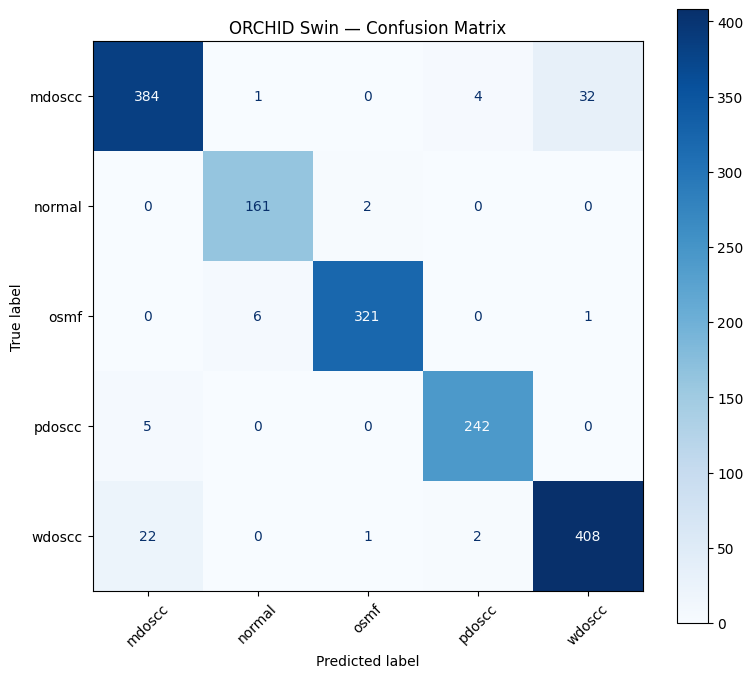

MULTICLASS AUC
Macro AUC (One-vs-Rest): 0.9975

Per-class AUC:
mdoscc    : 0.9934
normal    : 0.9993
osmf      : 0.9996
pdoscc    : 0.9996
wdoscc    : 0.9956


In [91]:
# ============================================================
# FINAL ORCHID SWIN — TEST EVALUATION
# ============================================================

import torch
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay
)
from sklearn.preprocessing import label_binarize

# ------------------------------------------------------------
# 1. Load BEST ORCHID Swin checkpoint
# ------------------------------------------------------------

BEST_CHECKPOINT = "/kaggle/working/best_orchid_swin.pth"

# Make sure we are using the same model architecture
orchid_swin.load_state_dict(
    torch.load(
        BEST_CHECKPOINT,
        map_location=device
    )
)

orchid_swin = orchid_swin.to(device)
orchid_swin.eval()

print("✓ Best ORCHID Swin checkpoint loaded")
print("✓ Best validation accuracy: 95.60%")
print()


# ------------------------------------------------------------
# 2. Class names
# ------------------------------------------------------------

CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]

NUM_CLASSES = len(CLASS_NAMES)


# ------------------------------------------------------------
# 3. Run inference on TEST SET
# ------------------------------------------------------------

all_labels = []
all_predictions = []
all_probabilities = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        # Forward pass
        logits = orchid_swin(images)

        # Probabilities
        probabilities = torch.softmax(logits, dim=1)

        # Predictions
        predictions = torch.argmax(logits, dim=1)

        # Store results
        all_labels.extend(
            labels.cpu().numpy()
        )

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_probabilities.extend(
            probabilities.cpu().numpy()
        )


all_labels = np.array(all_labels)
all_predictions = np.array(all_predictions)
all_probabilities = np.array(all_probabilities)

print("✓ Test inference complete")
print("Number of test images:", len(all_labels))
print()


# ============================================================
# 4. FINAL TEST ACCURACY + PER-CLASS METRICS
# ============================================================

print("=" * 70)
print("FINAL ORCHID SWIN TEST PERFORMANCE")
print("=" * 70)

report = classification_report(
    all_labels,
    all_predictions,
    target_names=CLASS_NAMES,
    digits=4
)

print(report)


# ============================================================
# 5. CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(
    all_labels,
    all_predictions
)

print("=" * 70)
print("CONFUSION MATRIX")
print("=" * 70)

print(cm)


# ------------------------------------------------------------
# Plot confusion matrix
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(8, 7))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=CLASS_NAMES
)

disp.plot(
    ax=ax,
    cmap="Blues",
    xticks_rotation=45,
    values_format="d"
)

ax.set_title("ORCHID Swin — Confusion Matrix")

plt.tight_layout()
plt.show()


# ============================================================
# 6. MULTICLASS AUC
# ============================================================

# Convert true labels into one-hot format
y_true_bin = label_binarize(
    all_labels,
    classes=np.arange(NUM_CLASSES)
)

# ------------------------------------------------------------
# Overall macro AUC
# ------------------------------------------------------------

macro_auc = roc_auc_score(
    y_true_bin,
    all_probabilities,
    multi_class="ovr",
    average="macro"
)

print("=" * 70)
print("MULTICLASS AUC")
print("=" * 70)

print(f"Macro AUC (One-vs-Rest): {macro_auc:.4f}")


# ------------------------------------------------------------
# Per-class AUC
# ------------------------------------------------------------

print("\nPer-class AUC:")

for i, class_name in enumerate(CLASS_NAMES):

    class_auc = roc_auc_score(
        y_true_bin[:, i],
        all_probabilities[:, i]
    )

    print(
        f"{class_name:10s}: {class_auc:.4f}"
    )

In [92]:
# ============================================================
# Explicit Final Test Accuracy
# ============================================================

test_accuracy = (all_predictions == all_labels).mean()

print(f"Final ORCHID Swin Test Accuracy: {test_accuracy * 100:.2f}%")

Final ORCHID Swin Test Accuracy: 95.23%


In [44]:
# ============================================================
# ORCHID CLIP — GENERATE FROZEN TEXT EMBEDDINGS
# ============================================================

import torch
import open_clip

# ------------------------------------------------------------
# Make sure CLIP is in evaluation mode and frozen
# ------------------------------------------------------------

clip_model.eval()

for param in clip_model.parameters():
    param.requires_grad = False


# ------------------------------------------------------------
# ORCHID class order
# ------------------------------------------------------------

ORCHID_CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]

print("ORCHID CLIP classes:")
for i, name in enumerate(ORCHID_CLASS_NAMES):
    print(f"{i}: {name}")


# ------------------------------------------------------------
# Generate text embeddings
# ------------------------------------------------------------

clip_text_embeddings = []

with torch.no_grad():

    for class_name in ORCHID_CLASS_NAMES:

        prompts = CLIP_PROMPTS[class_name]

        # Tokenize prompts using OpenCLIP tokenizer
        text_tokens = open_clip.tokenize(prompts).to(device)

        # Encode text
        text_features = clip_model.encode_text(text_tokens)

        # Normalize each prompt embedding
        text_features = text_features / text_features.norm(
            dim=-1,
            keepdim=True
        )

        # Average all prompts belonging to this class
        class_embedding = text_features.mean(dim=0)

        # Normalize again after averaging
        class_embedding = class_embedding / class_embedding.norm()

        clip_text_embeddings.append(class_embedding)


# ------------------------------------------------------------
# Stack into [5, embedding_dim]
# ------------------------------------------------------------

clip_text_embeddings = torch.stack(
    clip_text_embeddings
).to(device)


# ------------------------------------------------------------
# Verification
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("CLIP TEXT EMBEDDINGS")
print("=" * 60)

print("Shape:", clip_text_embeddings.shape)
print("Device:", clip_text_embeddings.device)
print("Requires grad:", clip_text_embeddings.requires_grad)

print("\nClass order:")
for i, name in enumerate(ORCHID_CLASS_NAMES):
    print(f"{i}: {name}")

print("=" * 60)

ORCHID CLIP classes:
0: mdoscc
1: normal
2: osmf
3: pdoscc
4: wdoscc

CLIP TEXT EMBEDDINGS
Shape: torch.Size([5, 512])
Device: cuda:0
Requires grad: False

Class order:
0: mdoscc
1: normal
2: osmf
3: pdoscc
4: wdoscc


In [45]:
# ============================================================
# ORCHID EXPERIMENT 1 — SWIN MULTI-STAGE ENCODER
# ============================================================

import torch
import torch.nn as nn


class SwinMultiStageEncoder(nn.Module):

    def __init__(self, backbone):

        super().__init__()

        self.patch_embed = backbone.patch_embed
        self.layers = backbone.layers
        self.norm = backbone.norm

    def forward(self, x):

        # ----------------------------------------------------
        # Patch Embedding
        # ----------------------------------------------------

        x = self.patch_embed(x)

        # ----------------------------------------------------
        # Swin Stage 1
        # ----------------------------------------------------

        s1 = self.layers[0](x)

        # ----------------------------------------------------
        # Swin Stage 2
        # ----------------------------------------------------

        s2 = self.layers[1](s1)

        # ----------------------------------------------------
        # Swin Stage 3
        # ----------------------------------------------------

        s3 = self.layers[2](s2)

        # ----------------------------------------------------
        # Swin Stage 4
        # ----------------------------------------------------

        s4 = self.layers[3](s3)

        return s1, s2, s3, s4

In [46]:
# ============================================================
# LIST ALL MODEL / CHECKPOINT FILES IN KAGGLE INPUT
# ============================================================

import os

INPUT_DIR = "/kaggle/input"

model_extensions = (
    ".pth",
    ".pt",
    ".ckpt",
    ".bin",
    ".safetensors",
    ".h5",
    ".keras",
    ".onnx"
)

model_files = []

for root, dirs, files in os.walk(INPUT_DIR):

    for file in files:

        if file.lower().endswith(model_extensions):

            full_path = os.path.join(root, file)

            size_mb = os.path.getsize(full_path) / (1024 ** 2)

            model_files.append(
                {
                    "name": file,
                    "path": full_path,
                    "size_mb": size_mb
                }
            )


# ============================================================
# DISPLAY RESULTS
# ============================================================

print("=" * 90)
print("ALL MODEL / CHECKPOINT FILES IN /kaggle/input")
print("=" * 90)

if len(model_files) == 0:

    print("❌ No model/checkpoint files found.")

else:

    for i, item in enumerate(model_files, start=1):

        print(f"\n[{i}] {item['name']}")
        print(f"    Size : {item['size_mb']:.2f} MB")
        print(f"    Path : {item['path']}")

print("\n" + "=" * 90)
print(f"TOTAL MODEL FILES FOUND: {len(model_files)}")
print("=" * 90)

ALL MODEL / CHECKPOINT FILES IN /kaggle/input

[1] best_stage1_swin.pth
    Size : 106.56 MB
    Path : /kaggle/input/datasets/mahrukh05/ndb-pretrained-weights/best_stage1_swin.pth

[2] best_orchid_hybrid_stage2.pth
    Size : 581.80 MB
    Path : /kaggle/input/datasets/mahrukh05/hybrid-stage-2/best_orchid_hybrid_stage2.pth

[3] best_orchid_hybrid_stage1 (3).pth
    Size : 373.49 MB
    Path : /kaggle/input/datasets/mahrukh05/hybrid-stage-1/best_orchid_hybrid_stage1 (3).pth

[4] best_orchid_swin.pth
    Size : 106.56 MB
    Path : /kaggle/input/datasets/mahrukh05/orchid-swin-model/best_orchid_swin.pth

TOTAL MODEL FILES FOUND: 4


In [56]:
# ============================================================
# BUILD MULTI-STAGE ENCODER FROM TRAINED ORCHID SWIN
# ============================================================

# Load best ORCHID Swin checkpoint again
BEST_ORCHID_SWIN = "/kaggle/input/datasets/mahrukh05/orchid-swin-model/best_orchid_swin.pth"

orchid_swin.load_state_dict(
    torch.load(
        BEST_ORCHID_SWIN,
        map_location=device
    )
)

orchid_swin = orchid_swin.to(device)

print("✓ Best ORCHID Swin loaded")
print("✓ Validation Accuracy: 95.60%")


# ------------------------------------------------------------
# Extract the trained Swin backbone
# ------------------------------------------------------------

orchid_swin_backbone = orchid_swin.backbone


# ------------------------------------------------------------
# Create multi-stage encoder
# ------------------------------------------------------------

orchid_encoder = SwinMultiStageEncoder(
    orchid_swin_backbone
).to(device)

print("✓ ORCHID Swin Multi-Stage Encoder created")

✓ Best ORCHID Swin loaded
✓ Validation Accuracy: 95.60%
✓ ORCHID Swin Multi-Stage Encoder created


In [58]:
# ============================================================
# VERIFY ORCHID SWIN MULTI-STAGE OUTPUTS
# ============================================================

orchid_encoder.eval()

dummy_input = torch.randn(
    2,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():

    s1, s2, s3, s4 = orchid_encoder(dummy_input)


print("=" * 60)
print("ORCHID SWIN MULTI-STAGE OUTPUTS")
print("=" * 60)

print("Input :", dummy_input.shape)

print("S1    :", s1.shape)
print("S2    :", s2.shape)
print("S3    :", s3.shape)
print("S4    :", s4.shape)

print("=" * 60)

ORCHID SWIN MULTI-STAGE OUTPUTS
Input : torch.Size([2, 3, 224, 224])
S1    : torch.Size([2, 56, 56, 96])
S2    : torch.Size([2, 28, 28, 192])
S3    : torch.Size([2, 14, 14, 384])
S4    : torch.Size([2, 7, 7, 768])


In [59]:
# ============================================================
# Semantic Cross Attention Block
# ============================================================

import torch
import torch.nn as nn


class SemanticCrossAttentionBlock(nn.Module):

    def __init__(
        self,
        input_dim,
        embed_dim=512,
        num_heads=8
    ):

        super().__init__()

        # ----------------------------------------------------
        # Project Swin visual features → CLIP embedding space
        # ----------------------------------------------------

        self.visual_projection = nn.Linear(
            input_dim,
            embed_dim
        )

        # ----------------------------------------------------
        # Cross Attention
        #
        # Query  = visual features
        # Key    = CLIP semantic embeddings
        # Value  = CLIP semantic embeddings
        # ----------------------------------------------------

        self.cross_attention = nn.MultiheadAttention(
            embed_dim=embed_dim,
            num_heads=num_heads,
            batch_first=True
        )

        # ----------------------------------------------------
        # Residual + normalization
        # ----------------------------------------------------

        self.norm1 = nn.LayerNorm(embed_dim)

        # ----------------------------------------------------
        # Feed Forward Network
        # ----------------------------------------------------

        self.ffn = nn.Sequential(

            nn.Linear(embed_dim, embed_dim * 2),

            nn.GELU(),

            nn.Linear(embed_dim * 2, embed_dim)
        )

        self.norm2 = nn.LayerNorm(embed_dim)

    def forward(
        self,
        visual_features,
        text_embeddings
    ):

        # ----------------------------------------------------
        # visual_features:
        #
        # [B,H,W,C]
        # ----------------------------------------------------

        B, H, W, C = visual_features.shape

        # ----------------------------------------------------
        # Flatten spatial locations
        # ----------------------------------------------------

        visual = visual_features.reshape(
            B,
            H * W,
            C
        )

        # ----------------------------------------------------
        # Project visual features
        #
        # [B,H*W,C]
        # →
        # [B,H*W,512]
        # ----------------------------------------------------

        visual = self.visual_projection(
            visual
        )

        # ----------------------------------------------------
        # CLIP text embeddings
        #
        # [5,512]
        #
        # Expand for each image in batch
        # ----------------------------------------------------

        text = text_embeddings.unsqueeze(0).expand(
            B,
            -1,
            -1
        )

        # ----------------------------------------------------
        # Cross Attention
        # ----------------------------------------------------

        attended, _ = self.cross_attention(
            query=visual,
            key=text,
            value=text
        )

        # ----------------------------------------------------
        # Residual connection
        # ----------------------------------------------------

        visual = self.norm1(
            visual + attended
        )

        # ----------------------------------------------------
        # Feed Forward
        # ----------------------------------------------------

        refined = self.ffn(
            visual
        )

        visual = self.norm2(
            visual + refined
        )

        # ----------------------------------------------------
        # Restore spatial structure
        # ----------------------------------------------------

        visual = visual.reshape(
            B,
            H,
            W,
            512
        )

        return visual

In [60]:
# ============================================================
# ORCHID Multi-Scale Semantic Fusion
# ============================================================

class MultiScaleSemanticFusion(nn.Module):

    def __init__(self):

        super().__init__()

        # ----------------------------------------------------
        # Stage 1
        # Swin: 96 → 512
        # ----------------------------------------------------

        self.stage1 = SemanticCrossAttentionBlock(
            input_dim=96,
            embed_dim=512,
            num_heads=CFG.NUM_HEADS
        )

        # ----------------------------------------------------
        # Stage 2
        # Swin: 192 → 512
        # ----------------------------------------------------

        self.stage2 = SemanticCrossAttentionBlock(
            input_dim=192,
            embed_dim=512,
            num_heads=CFG.NUM_HEADS
        )

        # ----------------------------------------------------
        # Stage 3
        # Swin: 384 → 512
        # ----------------------------------------------------

        self.stage3 = SemanticCrossAttentionBlock(
            input_dim=384,
            embed_dim=512,
            num_heads=CFG.NUM_HEADS
        )

        # ----------------------------------------------------
        # Stage 4
        # Swin: 768 → 512
        # ----------------------------------------------------

        self.stage4 = SemanticCrossAttentionBlock(
            input_dim=768,
            embed_dim=512,
            num_heads=CFG.NUM_HEADS
        )

    def forward(
        self,
        s1,
        s2,
        s3,
        s4,
        text_embeddings
    ):

        s1 = self.stage1(
            s1,
            text_embeddings
        )

        s2 = self.stage2(
            s2,
            text_embeddings
        )

        s3 = self.stage3(
            s3,
            text_embeddings
        )

        s4 = self.stage4(
            s4,
            text_embeddings
        )

        return s1, s2, s3, s4

In [61]:
# ============================================================
# Create ORCHID Semantic Fusion
# ============================================================

semantic_fusion = MultiScaleSemanticFusion().to(device)

print("✓ Multi-Scale Semantic Fusion created")
print("✓ Stage 1: 96  → 512")
print("✓ Stage 2: 192 → 512")
print("✓ Stage 3: 384 → 512")
print("✓ Stage 4: 768 → 512")

✓ Multi-Scale Semantic Fusion created
✓ Stage 1: 96  → 512
✓ Stage 2: 192 → 512
✓ Stage 3: 384 → 512
✓ Stage 4: 768 → 512


In [62]:
# ============================================================
# VERIFY SWIN + CLIP SEMANTIC FUSION
# ============================================================

orchid_encoder.eval()
semantic_fusion.eval()

with torch.no_grad():

    fused_s1, fused_s2, fused_s3, fused_s4 = semantic_fusion(
        s1,
        s2,
        s3,
        s4,
        clip_text_embeddings
    )


print("=" * 60)
print("FUSED SEMANTIC FEATURES")
print("=" * 60)

print("S1:", fused_s1.shape)
print("S2:", fused_s2.shape)
print("S3:", fused_s3.shape)
print("S4:", fused_s4.shape)

print("=" * 60)

FUSED SEMANTIC FEATURES
S1: torch.Size([2, 56, 56, 512])
S2: torch.Size([2, 28, 28, 512])
S3: torch.Size([2, 14, 14, 512])
S4: torch.Size([2, 7, 7, 512])


In [63]:
# ============================================================
# U-Net Decoder
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F


class UNetDecoder(nn.Module):

    def __init__(self):

        super().__init__()

        # ----------------------------------------------------
        # Residual refinement blocks
        # ----------------------------------------------------

        self.decoder3 = ResidualConvBlock(512)

        self.decoder2 = ResidualConvBlock(512)

        self.decoder1 = ResidualConvBlock(512)

    def forward(
        self,
        s1,
        s2,
        s3,
        s4
    ):

        # ----------------------------------------------------
        # Convert [B,H,W,C] → [B,C,H,W]
        # ----------------------------------------------------

        s1 = s1.permute(0, 3, 1, 2)
        s2 = s2.permute(0, 3, 1, 2)
        s3 = s3.permute(0, 3, 1, 2)
        s4 = s4.permute(0, 3, 1, 2)

        # ====================================================
        # Decoder Stage 3
        # ====================================================

        x = F.interpolate(
            s4,
            scale_factor=2,
            mode="bilinear",
            align_corners=False
        )

        x = x + s3

        x = self.decoder3(x)

        # ====================================================
        # Decoder Stage 2
        # ====================================================

        x = F.interpolate(
            x,
            scale_factor=2,
            mode="bilinear",
            align_corners=False
        )

        x = x + s2

        x = self.decoder2(x)

        # ====================================================
        # Decoder Stage 1
        # ====================================================

        x = F.interpolate(
            x,
            scale_factor=2,
            mode="bilinear",
            align_corners=False
        )

        x = x + s1

        x = self.decoder1(x)

        return x

In [64]:
# ============================================================
# Residual Convolution Block
# ============================================================

import torch
import torch.nn as nn


class ResidualConvBlock(nn.Module):

    def __init__(self, channels=512):

        super().__init__()

        self.block = nn.Sequential(

            nn.Conv2d(
                channels,
                channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(channels),

            nn.GELU(),

            nn.Conv2d(
                channels,
                channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.BatchNorm2d(channels)
        )

        self.activation = nn.GELU()

    def forward(self, x):

        residual = x

        x = self.block(x)

        x = x + residual

        x = self.activation(x)

        return x

In [65]:
# ============================================================
# CREATE ORCHID U-NET DECODER
# ============================================================

decoder = UNetDecoder().to(device)

print("✓ U-Net Decoder created")

✓ U-Net Decoder created


In [66]:
# ============================================================
# VERIFY U-NET DECODER
# ============================================================

decoder.eval()

with torch.no_grad():

    decoder_output = decoder(
        fused_s1,
        fused_s2,
        fused_s3,
        fused_s4
    )

print("=" * 60)
print("U-NET DECODER OUTPUT")
print("=" * 60)

print("Decoder output:", decoder_output.shape)

U-NET DECODER OUTPUT
Decoder output: torch.Size([2, 512, 56, 56])


In [73]:
# ============================================================
# ORCHID EXPERIMENT 1 — COMPLETE HYBRID MODEL
# ============================================================

import torch
import torch.nn as nn


class SwinCLIPHybrid(nn.Module):

    def __init__(
        self,
        swin_encoder,
        text_embeddings,
        num_classes=5,
        freeze_encoder=False
    ):

        super().__init__()

        # ----------------------------------------------------
        # ORCHID-trained Swin Multi-Stage Encoder
        # ----------------------------------------------------

        self.encoder = swin_encoder

        # ----------------------------------------------------
        # Freeze encoder?
        #
        # We set this to False because the Swin has already
        # been adapted to ORCHID and we want the hybrid stage
        # to be able to fine-tune it jointly.
        # ----------------------------------------------------

        if freeze_encoder:

            for param in self.encoder.parameters():
                param.requires_grad = False

        # ----------------------------------------------------
        # Frozen CLIP semantic embeddings
        # ----------------------------------------------------

        self.register_buffer(
            "text_embeddings",
            text_embeddings
        )

        # ----------------------------------------------------
        # Multi-scale semantic fusion
        # ----------------------------------------------------

        self.semantic_fusion = MultiScaleSemanticFusion()

        # ----------------------------------------------------
        # U-Net decoder
        # ----------------------------------------------------

        self.decoder = UNetDecoder()

        # ----------------------------------------------------
        # Global average pooling
        # ----------------------------------------------------

        self.pool = nn.AdaptiveAvgPool2d(1)

        # ----------------------------------------------------
        # 5-class classifier
        # ----------------------------------------------------

        self.classifier = nn.Sequential(

            nn.Linear(
                512,
                256
            ),

            nn.GELU(),

            nn.Dropout(0.30),

            nn.Linear(
                256,
                num_classes
            )
        )

    def forward(self, x):

        # ====================================================
        # 1. SWIN MULTI-SCALE FEATURES
        # ====================================================

        s1, s2, s3, s4 = self.encoder(x)

        # ====================================================
        # 2. CLIP SEMANTIC FUSION
        # ====================================================

        s1, s2, s3, s4 = self.semantic_fusion(
            s1,
            s2,
            s3,
            s4,
            self.text_embeddings
        )

        # ====================================================
        # 3. U-NET DECODER
        # ====================================================

        decoder_features = self.decoder(
            s1,
            s2,
            s3,
            s4
        )

        # ====================================================
        # 4. GLOBAL POOLING
        # ====================================================

        x = self.pool(
            decoder_features
        )

        x = torch.flatten(
            x,
            1
        )

        # ====================================================
        # 5. CLASSIFICATION
        # ====================================================

        logits = self.classifier(x)

        return {
            "logits": logits,

            "decoder_features": decoder_features,

            "semantic_features": {
                "stage1": s1,
                "stage2": s2,
                "stage3": s3,
                "stage4": s4
            }
        }

In [74]:
# ============================================================
# CREATE ORCHID HYBRID MODEL
# ============================================================

hybrid_model = SwinCLIPHybrid(
    swin_encoder=orchid_encoder,
    text_embeddings=clip_text_embeddings,
    num_classes=5,
    freeze_encoder=False
).to(device)

print("=" * 60)
print("ORCHID HYBRID MODEL CREATED")
print("=" * 60)

print("Classes :", 5)
print("Encoder :", "ORCHID-trained Swin-Tiny")
print("CLIP    :", "Frozen")
print("Decoder :", "U-Net + Residual Blocks")
print("=" * 60)

ORCHID HYBRID MODEL CREATED
Classes : 5
Encoder : ORCHID-trained Swin-Tiny
CLIP    : Frozen
Decoder : U-Net + Residual Blocks


In [110]:
# ============================================================
# VERIFY COMPLETE ORCHID HYBRID
# ============================================================

hybrid_model.eval()

dummy_input = torch.randn(
    2,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():

    output = hybrid_model(
        dummy_input
    )

print("=" * 60)
print("COMPLETE HYBRID FORWARD PASS")
print("=" * 60)

print("Input shape       :", dummy_input.shape)

print(
    "Logits shape      :",
    output["logits"].shape
)

print(
    "Decoder features  :",
    output["decoder_features"].shape
)

print(
    "Semantic stage 1  :",
    output["semantic_features"]["stage1"].shape
)

print(
    "Semantic stage 2  :",
    output["semantic_features"]["stage2"].shape
)

print(
    "Semantic stage 3  :",
    output["semantic_features"]["stage3"].shape
)

print(
    "Semantic stage 4  :",
    output["semantic_features"]["stage4"].shape
)

print("=" * 60)

COMPLETE HYBRID FORWARD PASS
Input shape       : torch.Size([2, 3, 224, 224])
Logits shape      : torch.Size([2, 5])
Decoder features  : torch.Size([2, 512, 56, 56])
Semantic stage 1  : torch.Size([2, 56, 56, 512])
Semantic stage 2  : torch.Size([2, 28, 28, 512])
Semantic stage 3  : torch.Size([2, 14, 14, 512])
Semantic stage 4  : torch.Size([2, 7, 7, 512])


In [111]:
# ============================================================
# HYBRID STAGE 1
# Freeze Swin + CLIP
# Train Semantic Fusion + Decoder + Classifier
# ============================================================

# ------------------------------------------------------------
# Freeze ORCHID-trained Swin encoder
# ------------------------------------------------------------

for param in hybrid_model.encoder.parameters():
    param.requires_grad = False


# ------------------------------------------------------------
# CLIP text embeddings are already registered as a buffer
# They do NOT require gradients.
# ------------------------------------------------------------

hybrid_model.eval()

# Put trainable components in training mode
hybrid_model.semantic_fusion.train()
hybrid_model.decoder.train()
hybrid_model.classifier.train()


print("=" * 60)
print("HYBRID STAGE 1")
print("=" * 60)

print("Swin Encoder     : FROZEN")
print("CLIP             : FROZEN")
print("Semantic Fusion  : TRAINABLE")
print("U-Net Decoder    : TRAINABLE")
print("Classifier       : TRAINABLE")
print("=" * 60)

HYBRID STAGE 1
Swin Encoder     : FROZEN
CLIP             : FROZEN
Semantic Fusion  : TRAINABLE
U-Net Decoder    : TRAINABLE
Classifier       : TRAINABLE


In [112]:
# ============================================================
# VERIFY TRAINABLE PARAMETERS
# ============================================================

trainable_params = 0
frozen_params = 0

for name, param in hybrid_model.named_parameters():

    if param.requires_grad:
        trainable_params += param.numel()

    else:
        frozen_params += param.numel()


print("=" * 60)
print("PARAMETER STATUS")
print("=" * 60)

print(
    f"Trainable parameters : {trainable_params:,}"
)

print(
    f"Frozen parameters    : {frozen_params:,}"
)

print("=" * 60)

PARAMETER STATUS
Trainable parameters : 23,444,997
Frozen parameters    : 27,519,354


In [114]:
# ============================================================
# HYBRID TRAINING — ONE EPOCH
# ============================================================

from tqdm.auto import tqdm


def train_hybrid_one_epoch(
    model,
    loader,
    optimizer,
    criterion,
    device
):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    progress = tqdm(
        loader,
        desc="Training",
        leave=False
    )

    for images, labels in progress:

        # -----------------------------------------
        # Move data to GPU
        # -----------------------------------------

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )

        # -----------------------------------------
        # Clear gradients
        # -----------------------------------------

        optimizer.zero_grad()

        # -----------------------------------------
        # Forward pass
        # -----------------------------------------

        outputs = model(images)

        # Hybrid model returns a dictionary
        logits = outputs["logits"]

        # -----------------------------------------
        # Classification loss
        # -----------------------------------------

        loss = criterion(
            logits,
            labels
        )

        # -----------------------------------------
        # Backpropagation
        # -----------------------------------------

        loss.backward()

        optimizer.step()

        # -----------------------------------------
        # Statistics
        # -----------------------------------------

        running_loss += loss.item()

        predictions = logits.argmax(dim=1)

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

        # -----------------------------------------
        # Progress display
        # -----------------------------------------

        current_loss = (
            running_loss /
            (progress.n + 1)
        )

        current_acc = (
            100.0 * correct / total
        )

        progress.set_postfix(
            loss=f"{current_loss:.4f}",
            acc=f"{current_acc:.2f}%"
        )

    # -----------------------------------------
    # Epoch statistics
    # -----------------------------------------

    epoch_loss = (
        running_loss /
        len(loader)
    )

    epoch_accuracy = (
        correct /
        total
    )

    return epoch_loss, epoch_accuracy


print("✓ train_hybrid_one_epoch() defined successfully")

✓ train_hybrid_one_epoch() defined successfully


In [115]:
# ============================================================
# HYBRID VALIDATION
# ============================================================

def validate_hybrid(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(
                device,
                non_blocking=True
            )

            labels = labels.to(
                device,
                non_blocking=True
            )

            # Forward
            outputs = model(images)

            logits = outputs["logits"]

            # Loss
            loss = criterion(
                logits,
                labels
            )

            running_loss += loss.item()

            # Predictions
            predictions = logits.argmax(dim=1)

            correct += (
                predictions == labels
            ).sum().item()

            total += labels.size(0)

    epoch_loss = (
        running_loss /
        len(loader)
    )

    epoch_accuracy = (
        correct /
        total
    )

    return epoch_loss, epoch_accuracy


print("✓ validate_hybrid() defined successfully")

✓ validate_hybrid() defined successfully


In [117]:
# ============================================================
# STAGE 1 OPTIMIZER
# ============================================================

import torch.optim as optim

stage1_optimizer = optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        hybrid_model.parameters()
    ),
    lr=1e-4,
    weight_decay=0.05
)

print("=" * 60)
print("STAGE 1 OPTIMIZER CREATED")
print("=" * 60)

print("Learning rate :", stage1_optimizer.param_groups[0]["lr"])
print("Weight decay  :", stage1_optimizer.param_groups[0]["weight_decay"])

STAGE 1 OPTIMIZER CREATED
Learning rate : 0.0001
Weight decay  : 0.05


In [118]:
# ============================================================
# VERIFY STAGE 1 OPTIMIZER
# ============================================================

print("Optimizer exists :", "stage1_optimizer" in globals())
print("Criterion exists :", "criterion" in globals())
print("Hybrid exists    :", "hybrid_model" in globals())
print("Train loader     :", "train_loader" in globals())
print("Val loader       :", "val_loader" in globals())

Optimizer exists : True
Criterion exists : True
Hybrid exists    : True
Train loader     : True
Val loader       : True


In [122]:
# ============================================================
# ORCHID HYBRID — STAGE 1 TRAINING
# ============================================================

import os

STAGE1_EPOCHS = 10

BEST_STAGE1_PATH = (
    "/kaggle/working/best_orchid_hybrid_stage1.pth"
)

best_val_accuracy = 0.0
best_epoch = 0

print("=" * 70)
print("STARTING ORCHID HYBRID STAGE 1")
print("=" * 70)

print(f"Epochs: {STAGE1_EPOCHS}")
print("Swin: FROZEN")
print("CLIP: FROZEN")
print("Fusion: TRAINABLE")
print("Decoder: TRAINABLE")
print("Classifier: TRAINABLE")

print("=" * 70)


for epoch in range(1, STAGE1_EPOCHS + 1):

    print()
    print(f"Epoch [{epoch}/{STAGE1_EPOCHS}]")
    print("-" * 70)

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_acc = train_hybrid_one_epoch(
        hybrid_model,
        train_loader,
        stage1_optimizer,
        criterion,
        device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_acc = validate_hybrid(
        hybrid_model,
        val_loader,
        criterion,
        device
    )

    # --------------------------------------------------------
    # CURRENT LEARNING RATE
    # --------------------------------------------------------

    current_lr = stage1_optimizer.param_groups[0]["lr"]

    # --------------------------------------------------------
    # PRINT RESULTS
    # --------------------------------------------------------

    print()
    print(f"Train Loss       : {train_loss:.4f}")
    print(
        f"Train Accuracy   : "
        f"{train_acc * 100:.2f}%"
    )

    print(f"Val Loss         : {val_loss:.4f}")
    print(
        f"Val Accuracy     : "
        f"{val_acc * 100:.2f}%"
    )

    print(
        f"Learning Rate    : "
        f"{current_lr:.2e}"
    )

    # --------------------------------------------------------
    # SAVE BEST MODEL
    # --------------------------------------------------------

    if val_acc > best_val_accuracy:

        best_val_accuracy = val_acc
        best_epoch = epoch

        torch.save(
            {
                "epoch": epoch,

                "model_state_dict":
                    hybrid_model.state_dict(),

                "optimizer_state_dict":
                    stage1_optimizer.state_dict(),

                "scheduler_state_dict":
                    stage1_scheduler.state_dict(),

                "val_accuracy":
                    val_acc,

                "val_loss":
                    val_loss
            },
            BEST_STAGE1_PATH
        )

        print(
            f"✓ BEST STAGE 1 MODEL SAVED "
            f"(Val Acc: "
            f"{val_acc * 100:.2f}%)"
        )

    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    stage1_scheduler.step()


print()
print("=" * 70)
print("ORCHID HYBRID STAGE 1 COMPLETE")
print("=" * 70)

print(
    f"Best Epoch     : {best_epoch}"
)

print(
    f"Best Val Acc   : "
    f"{best_val_accuracy * 100:.2f}%"
)

print(
    f"Checkpoint     : "
    f"{BEST_STAGE1_PATH}"
)

print(
    "Checkpoint exists:",
    os.path.exists(BEST_STAGE1_PATH)
)

STARTING ORCHID HYBRID STAGE 1
Epochs: 10
Swin: FROZEN
CLIP: FROZEN
Fusion: TRAINABLE
Decoder: TRAINABLE
Classifier: TRAINABLE

Epoch [1/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Train Loss       : 0.0851
Train Accuracy   : 96.94%
Val Loss         : 0.1358
Val Accuracy     : 95.32%
Learning Rate    : 9.76e-05
✓ BEST STAGE 1 MODEL SAVED (Val Acc: 95.32%)

Epoch [2/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0779
Train Accuracy   : 97.02%
Val Loss         : 0.1488
Val Accuracy     : 95.53%
Learning Rate    : 9.05e-05
✓ BEST STAGE 1 MODEL SAVED (Val Acc: 95.53%)

Epoch [3/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0724
Train Accuracy   : 97.20%
Val Loss         : 0.1491
Val Accuracy     : 95.08%
Learning Rate    : 7.96e-05

Epoch [4/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0653
Train Accuracy   : 97.33%
Val Loss         : 0.1461
Val Accuracy     : 95.36%
Learning Rate    : 6.58e-05

Epoch [5/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0637
Train Accuracy   : 97.40%
Val Loss         : 0.1328
Val Accuracy     : 95.42%
Learning Rate    : 5.05e-05

Epoch [6/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0642
Train Accuracy   : 97.40%
Val Loss         : 0.1261
Val Accuracy     : 95.84%
Learning Rate    : 3.52e-05
✓ BEST STAGE 1 MODEL SAVED (Val Acc: 95.84%)

Epoch [7/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Train Loss       : 0.0528
Train Accuracy   : 97.88%
Val Loss         : 0.1343
Val Accuracy     : 95.60%
Learning Rate    : 2.14e-05

Epoch [8/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Train Loss       : 0.0548
Train Accuracy   : 97.74%
Val Loss         : 0.1316
Val Accuracy     : 95.74%
Learning Rate    : 1.05e-05

Epoch [9/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
Exception ignored in:     self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>

Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
        if w.is_alive():self._shutdown_workers()

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
        if w.is_alive(): 
    ^   ^^ ^ ^^^^^^^^^^^^^^^^
^  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^    assert self._parent_pid == os.getpid(), 'can only test a child process'^
^  
  File "/usr/lib/pyth


Train Loss       : 0.0558
Train Accuracy   : 97.81%
Val Loss         : 0.1283
Val Accuracy     : 95.81%
Learning Rate    : 3.42e-06

Epoch [10/10]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0536
Train Accuracy   : 97.74%
Val Loss         : 0.1269
Val Accuracy     : 95.63%
Learning Rate    : 1.00e-06

ORCHID HYBRID STAGE 1 COMPLETE
Best Epoch     : 6
Best Val Acc   : 95.84%
Checkpoint     : /kaggle/working/best_orchid_hybrid_stage1.pth
Checkpoint exists: True


In [123]:
# ============================================================
# LOAD BEST STAGE 1 HYBRID CHECKPOINT
# ============================================================

BEST_STAGE1_PATH = "/kaggle/working/best_orchid_hybrid_stage1.pth"

checkpoint = torch.load(
    BEST_STAGE1_PATH,
    map_location=device
)

hybrid_model.load_state_dict(
    checkpoint["model_state_dict"]
)

print("=" * 70)
print("BEST STAGE 1 HYBRID CHECKPOINT LOADED")
print("=" * 70)

print(
    "Best Stage 1 Epoch :",
    checkpoint["epoch"]
)

print(
    "Best Stage 1 Val Acc :",
    f"{checkpoint['val_accuracy'] * 100:.2f}%"
)

BEST STAGE 1 HYBRID CHECKPOINT LOADED
Best Stage 1 Epoch : 6
Best Stage 1 Val Acc : 95.84%


In [128]:
# ============================================================
# STAGE 2 — UNFREEZE LATER SWIN STAGES
# ============================================================

# First freeze the entire encoder
for param in hybrid_model.encoder.parameters():
    param.requires_grad = False


# ------------------------------------------------------------
# Unfreeze Swin Stages 2, 3, 4
# ------------------------------------------------------------

for param in hybrid_model.encoder.layers[1].parameters():
    param.requires_grad = True

for param in hybrid_model.encoder.layers[2].parameters():
    param.requires_grad = True

for param in hybrid_model.encoder.layers[3].parameters():
    param.requires_grad = True


# ------------------------------------------------------------
# Keep CLIP text embeddings frozen
# ------------------------------------------------------------

hybrid_model.text_embeddings.requires_grad = False


# ------------------------------------------------------------
# Fusion + Decoder + Classifier remain trainable
# ------------------------------------------------------------

for param in hybrid_model.semantic_fusion.parameters():
    param.requires_grad = True

for param in hybrid_model.decoder.parameters():
    param.requires_grad = True

for param in hybrid_model.classifier.parameters():
    param.requires_grad = True


print("=" * 70)
print("STAGE 2 PARAMETER CONFIGURATION")
print("=" * 70)

print("Swin Stage 1 : FROZEN")
print("Swin Stage 2 : TRAINABLE")
print("Swin Stage 3 : TRAINABLE")
print("Swin Stage 4 : TRAINABLE")
print("CLIP         : FROZEN")
print("Fusion       : TRAINABLE")
print("Decoder      : TRAINABLE")
print("Classifier   : TRAINABLE")

STAGE 2 PARAMETER CONFIGURATION
Swin Stage 1 : FROZEN
Swin Stage 2 : TRAINABLE
Swin Stage 3 : TRAINABLE
Swin Stage 4 : TRAINABLE
CLIP         : FROZEN
Fusion       : TRAINABLE
Decoder      : TRAINABLE
Classifier   : TRAINABLE


In [129]:
# ============================================================
# VERIFY STAGE 2 TRAINABLE PARAMETERS
# ============================================================

total_params = sum(
    p.numel()
    for p in hybrid_model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in hybrid_model.parameters()
    if p.requires_grad
)

frozen_params = total_params - trainable_params

print("=" * 70)
print("STAGE 2 PARAMETER SUMMARY")
print("=" * 70)

print(f"Total parameters     : {total_params:,}")
print(f"Trainable parameters : {trainable_params:,}")
print(f"Frozen parameters    : {frozen_params:,}")

STAGE 2 PARAMETER SUMMARY
Total parameters     : 50,964,351
Trainable parameters : 50,733,225
Frozen parameters    : 231,126


In [130]:
# ============================================================
# STAGE 2 OPTIMIZER
# ============================================================

stage2_optimizer = torch.optim.AdamW(
    [
        # ----------------------------------------------------
        # Swin Stage 2
        # ----------------------------------------------------
        {
            "params":
                hybrid_model.encoder.layers[1].parameters(),
            "lr": 1e-5
        },

        # ----------------------------------------------------
        # Swin Stage 3
        # ----------------------------------------------------
        {
            "params":
                hybrid_model.encoder.layers[2].parameters(),
            "lr": 1e-5
        },

        # ----------------------------------------------------
        # Swin Stage 4
        # ----------------------------------------------------
        {
            "params":
                hybrid_model.encoder.layers[3].parameters(),
            "lr": 1e-5
        },

        # ----------------------------------------------------
        # Semantic Fusion
        # ----------------------------------------------------
        {
            "params":
                hybrid_model.semantic_fusion.parameters(),
            "lr": 1e-4
        },

        # ----------------------------------------------------
        # Decoder
        # ----------------------------------------------------
        {
            "params":
                hybrid_model.decoder.parameters(),
            "lr": 1e-4
        },

        # ----------------------------------------------------
        # Classifier
        # ----------------------------------------------------
        {
            "params":
                hybrid_model.classifier.parameters(),
            "lr": 2e-4
        }
    ],

    weight_decay=0.05
)

print("=" * 70)
print("STAGE 2 OPTIMIZER CREATED")
print("=" * 70)

for i, group in enumerate(stage2_optimizer.param_groups):

    print(
        f"Group {i} LR : "
        f"{group['lr']:.2e}"
    )

STAGE 2 OPTIMIZER CREATED
Group 0 LR : 1.00e-05
Group 1 LR : 1.00e-05
Group 2 LR : 1.00e-05
Group 3 LR : 1.00e-04
Group 4 LR : 1.00e-04
Group 5 LR : 2.00e-04


In [131]:
# ============================================================
# STAGE 2 SCHEDULER
# ============================================================

STAGE2_EPOCHS = 15

stage2_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    stage2_optimizer,
    T_max=STAGE2_EPOCHS,
    eta_min=1e-7
)

print("=" * 70)
print("STAGE 2 SCHEDULER READY")
print("=" * 70)

STAGE 2 SCHEDULER READY


In [132]:
# ============================================================
# ORCHID HYBRID — STAGE 2 TRAINING
# ============================================================

STAGE2_EPOCHS = 15

BEST_STAGE2_PATH = (
    "/kaggle/working/best_orchid_hybrid_stage2.pth"
)

best_stage2_val_accuracy = 0.0
best_stage2_epoch = 0

print("=" * 70)
print("STARTING ORCHID HYBRID STAGE 2")
print("=" * 70)

print(f"Epochs: {STAGE2_EPOCHS}")
print("Swin Stage 1: FROZEN")
print("Swin Stage 2: TRAINABLE")
print("Swin Stage 3: TRAINABLE")
print("Swin Stage 4: TRAINABLE")
print("CLIP: FROZEN")
print("Fusion: TRAINABLE")
print("Decoder: TRAINABLE")
print("Classifier: TRAINABLE")

print("=" * 70)


for epoch in range(1, STAGE2_EPOCHS + 1):

    print()
    print(f"Epoch [{epoch}/{STAGE2_EPOCHS}]")
    print("-" * 70)

    # --------------------------------------------------------
    # TRAIN
    # --------------------------------------------------------

    train_loss, train_acc = train_hybrid_one_epoch(
        hybrid_model,
        train_loader,
        stage2_optimizer,
        criterion,
        device
    )

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    val_loss, val_acc = validate_hybrid(
        hybrid_model,
        val_loader,
        criterion,
        device
    )

    # --------------------------------------------------------
    # PRINT RESULTS
    # --------------------------------------------------------

    print()
    print(f"Train Loss       : {train_loss:.4f}")
    print(
        f"Train Accuracy   : "
        f"{train_acc * 100:.2f}%"
    )

    print(f"Val Loss         : {val_loss:.4f}")
    print(
        f"Val Accuracy     : "
        f"{val_acc * 100:.2f}%"
    )

    # --------------------------------------------------------
    # PRINT LEARNING RATES
    # --------------------------------------------------------

    print(
        f"Swin LR          : "
        f"{stage2_optimizer.param_groups[0]['lr']:.2e}"
    )

    print(
        f"Fusion LR        : "
        f"{stage2_optimizer.param_groups[3]['lr']:.2e}"
    )

    print(
        f"Classifier LR    : "
        f"{stage2_optimizer.param_groups[5]['lr']:.2e}"
    )

    # --------------------------------------------------------
    # SAVE BEST MODEL
    # --------------------------------------------------------

    if val_acc > best_stage2_val_accuracy:

        best_stage2_val_accuracy = val_acc
        best_stage2_epoch = epoch

        torch.save(
            {
                "epoch": epoch,

                "model_state_dict":
                    hybrid_model.state_dict(),

                "optimizer_state_dict":
                    stage2_optimizer.state_dict(),

                "scheduler_state_dict":
                    stage2_scheduler.state_dict(),

                "val_accuracy":
                    val_acc,

                "val_loss":
                    val_loss
            },
            BEST_STAGE2_PATH
        )

        print(
            f"✓ BEST STAGE 2 MODEL SAVED "
            f"(Val Acc: "
            f"{val_acc * 100:.2f}%)"
        )

    # --------------------------------------------------------
    # SCHEDULER
    # --------------------------------------------------------

    stage2_scheduler.step()


print()
print("=" * 70)
print("ORCHID HYBRID STAGE 2 COMPLETE")
print("=" * 70)

print(
    f"Best Epoch     : "
    f"{best_stage2_epoch}"
)

print(
    f"Best Val Acc   : "
    f"{best_stage2_val_accuracy * 100:.2f}%"
)

print(
    f"Checkpoint     : "
    f"{BEST_STAGE2_PATH}"
)

print(
    "Checkpoint exists:",
    os.path.exists(BEST_STAGE2_PATH)
)

STARTING ORCHID HYBRID STAGE 2
Epochs: 15
Swin Stage 1: FROZEN
Swin Stage 2: TRAINABLE
Swin Stage 3: TRAINABLE
Swin Stage 4: TRAINABLE
CLIP: FROZEN
Fusion: TRAINABLE
Decoder: TRAINABLE
Classifier: TRAINABLE

Epoch [1/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Train Loss       : 0.1220
Train Accuracy   : 95.54%
Val Loss         : 0.1616
Val Accuracy     : 94.80%
Swin LR          : 1.00e-05
Fusion LR        : 1.00e-04
Classifier LR    : 2.00e-04
✓ BEST STAGE 2 MODEL SAVED (Val Acc: 94.80%)

Epoch [2/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.1091
Train Accuracy   : 95.75%
Val Loss         : 0.1400
Val Accuracy     : 95.01%
Swin LR          : 9.89e-06
Fusion LR        : 9.89e-05
Classifier LR    : 1.98e-04
✓ BEST STAGE 2 MODEL SAVED (Val Acc: 95.01%)

Epoch [3/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>if w.is_alive():

Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
      self._shutdown_workers()  
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
     ^if w.is_alive():
^ ^  ^^ ^ ^  ^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^^    ^assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ ^ 
   File "/usr/lib/p


Train Loss       : 0.0983
Train Accuracy   : 96.03%
Val Loss         : 0.1307
Val Accuracy     : 95.36%
Swin LR          : 9.57e-06
Fusion LR        : 9.57e-05
Classifier LR    : 1.91e-04
✓ BEST STAGE 2 MODEL SAVED (Val Acc: 95.36%)

Epoch [4/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0847
Train Accuracy   : 96.51%
Val Loss         : 0.1677
Val Accuracy     : 95.22%
Swin LR          : 9.05e-06
Fusion LR        : 9.05e-05
Classifier LR    : 1.81e-04

Epoch [5/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0802
Train Accuracy   : 96.83%
Val Loss         : 0.1276
Val Accuracy     : 94.90%
Swin LR          : 8.36e-06
Fusion LR        : 8.35e-05
Classifier LR    : 1.67e-04

Epoch [6/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0738
Train Accuracy   : 96.89%
Val Loss         : 0.1420
Val Accuracy     : 94.87%
Swin LR          : 7.53e-06
Fusion LR        : 7.50e-05
Classifier LR    : 1.50e-04

Epoch [7/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0630
Train Accuracy   : 97.41%
Val Loss         : 0.1593
Val Accuracy     : 94.59%
Swin LR          : 6.58e-06
Fusion LR        : 6.55e-05
Classifier LR    : 1.31e-04

Epoch [8/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0564
Train Accuracy   : 97.61%
Val Loss         : 0.1558
Val Accuracy     : 95.18%
Swin LR          : 5.57e-06
Fusion LR        : 5.53e-05
Classifier LR    : 1.10e-04

Epoch [9/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x796298da2a20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Train Loss       : 0.0474
Train Accuracy   : 97.85%
Val Loss         : 0.1367
Val Accuracy     : 95.39%
Swin LR          : 4.53e-06
Fusion LR        : 4.48e-05
Classifier LR    : 8.96e-05
✓ BEST STAGE 2 MODEL SAVED (Val Acc: 95.39%)

Epoch [10/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0419
Train Accuracy   : 98.06%
Val Loss         : 0.1329
Val Accuracy     : 96.19%
Swin LR          : 3.52e-06
Fusion LR        : 3.46e-05
Classifier LR    : 6.92e-05
✓ BEST STAGE 2 MODEL SAVED (Val Acc: 96.19%)

Epoch [11/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0389
Train Accuracy   : 98.22%
Val Loss         : 0.1234
Val Accuracy     : 96.05%
Swin LR          : 2.58e-06
Fusion LR        : 2.51e-05
Classifier LR    : 5.01e-05

Epoch [12/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]


Train Loss       : 0.0370
Train Accuracy   : 98.15%
Val Loss         : 0.1312
Val Accuracy     : 95.98%
Swin LR          : 1.74e-06
Fusion LR        : 1.66e-05
Classifier LR    : 3.32e-05

Epoch [13/15]
----------------------------------------------------------------------


Training:   0%|          | 0/320 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [133]:
# ============================================================
# LOAD BEST ORCHID HYBRID — STAGE 2
# ============================================================

BEST_STAGE2_PATH = (
    "/kaggle/working/best_orchid_hybrid_stage2.pth"
)

checkpoint = torch.load(
    BEST_STAGE2_PATH,
    map_location=device
)

hybrid_model.load_state_dict(
    checkpoint["model_state_dict"]
)

hybrid_model = hybrid_model.to(device)
hybrid_model.eval()

print("=" * 70)
print("BEST ORCHID HYBRID STAGE 2 CHECKPOINT LOADED")
print("=" * 70)

print(
    "Best Epoch      :",
    checkpoint["epoch"]
)

print(
    "Best Val Acc    :",
    f"{checkpoint['val_accuracy'] * 100:.2f}%"
)

print(
    "Checkpoint      :",
    BEST_STAGE2_PATH
)

print(
    "Checkpoint exists:",
    os.path.exists(BEST_STAGE2_PATH)
)

BEST ORCHID HYBRID STAGE 2 CHECKPOINT LOADED
Best Epoch      : 10
Best Val Acc    : 96.19%
Checkpoint      : /kaggle/working/best_orchid_hybrid_stage2.pth
Checkpoint exists: True



FINAL ORCHID HYBRID TEST PERFORMANCE
Test Images   : 1592
Test Accuracy : 95.73%

CLASSIFICATION REPORT
----------------------------------------------------------------------
              precision    recall  f1-score   support

      mdoscc     0.9484    0.9169    0.9324       421
      normal     0.9524    0.9816    0.9668       163
        osmf     0.9877    0.9787    0.9832       328
      pdoscc     0.9878    0.9838    0.9858       247
      wdoscc     0.9283    0.9561    0.9420       433

    accuracy                         0.9573      1592
   macro avg     0.9609    0.9634    0.9620      1592
weighted avg     0.9575    0.9573    0.9573      1592

CONFUSION MATRIX
[[386   1   0   2  32]
 [  0 160   3   0   0]
 [  0   7 321   0   0]
 [  4   0   0 243   0]
 [ 17   0   1   1 414]]


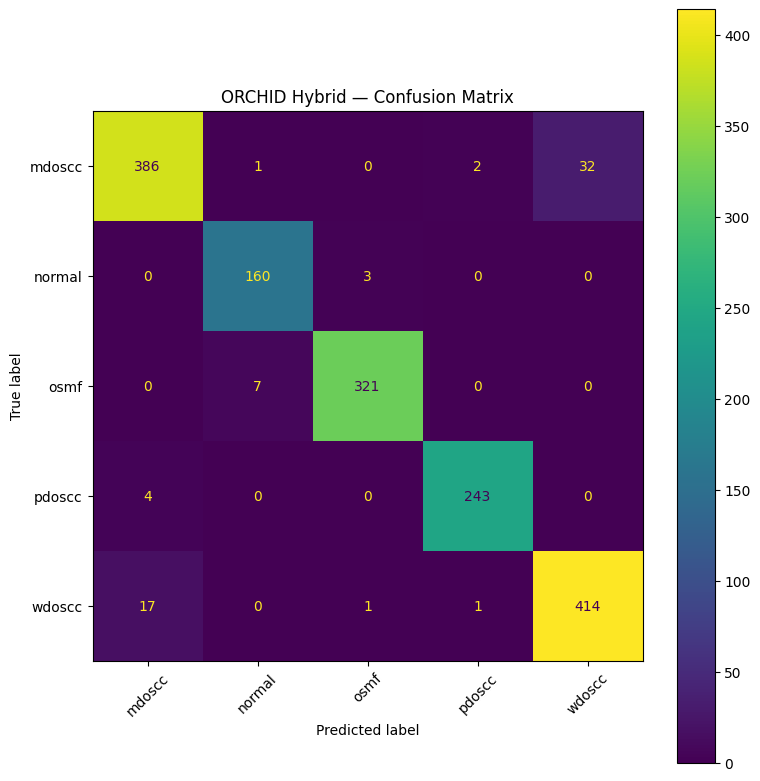

MULTICLASS ROC-AUC
Macro AUC    : 0.9976
Weighted AUC : 0.9970

PER-CLASS AUC
----------------------------------------------------------------------
mdoscc     : 0.9939
normal     : 0.9994
osmf       : 0.9988
pdoscc     : 0.9997
wdoscc     : 0.9961


In [134]:
# ============================================================
# FINAL ORCHID HYBRID TEST EVALUATION
# ============================================================

import numpy as np
import torch
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_auc_score
)

# ------------------------------------------------------------
# Class names
# ------------------------------------------------------------

CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]

NUM_CLASSES = len(CLASS_NAMES)

# ------------------------------------------------------------
# Evaluation
# ------------------------------------------------------------

hybrid_model.eval()

all_labels = []
all_predictions = []
all_probabilities = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = hybrid_model(images)

        # Hybrid returns dictionary
        logits = outputs["logits"]

        probabilities = torch.softmax(
            logits,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        all_labels.extend(
            labels.cpu().numpy()
        )

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_probabilities.extend(
            probabilities.cpu().numpy()
        )


# ------------------------------------------------------------
# Convert to NumPy
# ------------------------------------------------------------

all_labels = np.array(all_labels)
all_predictions = np.array(all_predictions)
all_probabilities = np.array(all_probabilities)

# ------------------------------------------------------------
# Test Accuracy
# ------------------------------------------------------------

test_accuracy = accuracy_score(
    all_labels,
    all_predictions
)

# ------------------------------------------------------------
# Classification Report
# ------------------------------------------------------------

report = classification_report(
    all_labels,
    all_predictions,
    target_names=CLASS_NAMES,
    digits=4
)

print()
print("=" * 70)
print("FINAL ORCHID HYBRID TEST PERFORMANCE")
print("=" * 70)

print(
    f"Test Images   : {len(all_labels)}"
)

print(
    f"Test Accuracy : {test_accuracy * 100:.2f}%"
)

print()
print("CLASSIFICATION REPORT")
print("-" * 70)

print(report)


# ------------------------------------------------------------
# Confusion Matrix
# ------------------------------------------------------------

cm = confusion_matrix(
    all_labels,
    all_predictions
)

print("=" * 70)
print("CONFUSION MATRIX")
print("=" * 70)

print(cm)


# ------------------------------------------------------------
# Plot Confusion Matrix
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(8, 8)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=CLASS_NAMES
)

disp.plot(
    ax=ax,
    values_format="d",
    xticks_rotation=45
)

ax.set_title(
    "ORCHID Hybrid — Confusion Matrix"
)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Multiclass ROC-AUC
# ------------------------------------------------------------

try:

    macro_auc = roc_auc_score(
        all_labels,
        all_probabilities,
        multi_class="ovr",
        average="macro"
    )

    weighted_auc = roc_auc_score(
        all_labels,
        all_probabilities,
        multi_class="ovr",
        average="weighted"
    )

    print("=" * 70)
    print("MULTICLASS ROC-AUC")
    print("=" * 70)

    print(
        f"Macro AUC    : {macro_auc:.4f}"
    )

    print(
        f"Weighted AUC : {weighted_auc:.4f}"
    )

    # --------------------------------------------------------
    # Per-class AUC
    # --------------------------------------------------------

    print()
    print("PER-CLASS AUC")
    print("-" * 70)

    per_class_auc = {}

    for i, class_name in enumerate(CLASS_NAMES):

        binary_labels = (
            all_labels == i
        ).astype(int)

        auc = roc_auc_score(
            binary_labels,
            all_probabilities[:, i]
        )

        per_class_auc[class_name] = auc

        print(
            f"{class_name:<10} : {auc:.4f}"
        )

except ValueError as e:

    print()
    print("ROC-AUC could not be calculated:")
    print(e)

In [135]:
# ============================================================
# HYBRID MODEL WRAPPER FOR EXPLAINABILITY
# ============================================================

class HybridExplainabilityWrapper(nn.Module):

    def __init__(self, hybrid_model):
        super().__init__()

        self.model = hybrid_model

    def forward(self, x):

        output = self.model(x)

        return output["logits"]

In [136]:
# ============================================================
# SELECT TARGET LAYER
# ============================================================

target_layer = hybrid_model.decoder.decoder1.block[0]

print("Target layer:")
print(target_layer)

Target layer:
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)


In [139]:
!pip install grad-cam -q

In [140]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [141]:
print(hybrid_model.decoder.decoder1)

ResidualConvBlock(
  (block): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (activation): GELU(approximate='none')
)


In [142]:
# ============================================================
# HYBRID GRAD-CAM TARGET LAYER
# ============================================================

target_layer = hybrid_model.decoder.decoder1.block[3]

print("✓ Target layer selected:")
print(target_layer)

✓ Target layer selected:
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)


In [143]:
# ============================================================
# HYBRID EXPLAINABILITY WRAPPER
# ============================================================

class HybridExplainabilityWrapper(nn.Module):

    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        output = self.model(x)
        return output["logits"]


cam_model = HybridExplainabilityWrapper(
    hybrid_model
).to(device)

cam_model.eval()

print("✓ Hybrid Grad-CAM wrapper ready")

✓ Hybrid Grad-CAM wrapper ready


In [144]:
# ============================================================
# SELECT TEST IMAGE
# ============================================================

hybrid_model.eval()

images, labels = next(iter(test_loader))

image = images[0:1].to(device)
true_label = labels[0].item()

with torch.no_grad():

    output = hybrid_model(image)

    logits = output["logits"]

    probabilities = torch.softmax(
        logits,
        dim=1
    )

    predicted_label = torch.argmax(
        probabilities,
        dim=1
    ).item()

confidence = probabilities[
    0,
    predicted_label
].item()

print("=" * 60)
print("EXPLAINABILITY SAMPLE")
print("=" * 60)

print(
    "True class      :",
    CLASS_NAMES[true_label]
)

print(
    "Predicted class :",
    CLASS_NAMES[predicted_label]
)

print(
    "Confidence      :",
    f"{confidence * 100:.2f}%"
)

EXPLAINABILITY SAMPLE
True class      : mdoscc
Predicted class : mdoscc
Confidence      : 99.98%


In [145]:
# ============================================================
# GENERATE GRAD-CAM
# ============================================================

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

targets = [
    ClassifierOutputTarget(predicted_label)
]

cam = GradCAM(
    model=cam_model,
    target_layers=[target_layer]
)

grayscale_cam = cam(
    input_tensor=image,
    targets=targets
)

grayscale_cam = grayscale_cam[0]

print(
    "✓ Grad-CAM generated"
)

print(
    "CAM shape:",
    grayscale_cam.shape
)

✓ Grad-CAM generated
CAM shape: (224, 224)


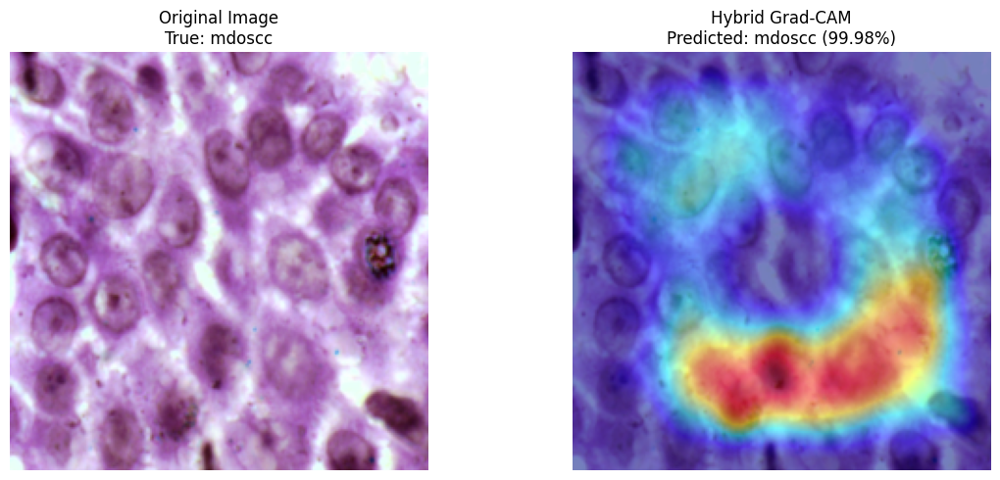

In [146]:
# ============================================================
# HYBRID GRAD-CAM VISUALIZATION
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam.utils.image import show_cam_on_image

# ------------------------------------------------------------
# ImageNet normalization values
# ------------------------------------------------------------

mean = np.array([
    0.485,
    0.456,
    0.406
])

std = np.array([
    0.229,
    0.224,
    0.225
])

# ------------------------------------------------------------
# Convert tensor -> RGB image
# ------------------------------------------------------------

rgb_image = image[0].detach().cpu().numpy()

rgb_image = np.transpose(
    rgb_image,
    (1, 2, 0)
)

# Undo normalization
rgb_image = (
    rgb_image * std + mean
)

rgb_image = np.clip(
    rgb_image,
    0,
    1
)

# ------------------------------------------------------------
# Create CAM overlay
# ------------------------------------------------------------

visualization = show_cam_on_image(
    rgb_image.astype(np.float32),
    grayscale_cam,
    use_rgb=True
)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)

plt.imshow(rgb_image)

plt.title(
    f"Original Image\n"
    f"True: {CLASS_NAMES[true_label]}"
)

plt.axis("off")


plt.subplot(1, 2, 2)

plt.imshow(visualization)

plt.title(
    f"Hybrid Grad-CAM\n"
    f"Predicted: {CLASS_NAMES[predicted_label]} "
    f"({confidence * 100:.2f}%)"
)

plt.axis("off")

plt.tight_layout()
plt.show()

In [147]:
# ============================================================
# FIND CORRECT / MISCLASSIFIED TEST EXAMPLES
# ============================================================

import torch
import numpy as np

hybrid_model.eval()

correct_examples = {}
wrong_examples = {}

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = hybrid_model(images)
        logits = outputs["logits"]

        probabilities = torch.softmax(logits, dim=1)
        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        for i in range(len(labels)):

            true_class = labels[i].item()
            pred_class = predictions[i].item()

            confidence = probabilities[
                i,
                pred_class
            ].item()

            sample = {
                "image": images[i:i+1].detach().cpu(),
                "true_label": true_class,
                "pred_label": pred_class,
                "confidence": confidence
            }

            # Correct example
            if (
                true_class == pred_class
                and true_class not in correct_examples
            ):
                correct_examples[true_class] = sample

            # Misclassified example
            if (
                true_class != pred_class
                and true_class not in wrong_examples
            ):
                wrong_examples[true_class] = sample


print("=" * 70)
print("CORRECT EXAMPLES")
print("=" * 70)

for class_id in sorted(correct_examples):

    sample = correct_examples[class_id]

    print(
        f"{CLASS_NAMES[class_id]:<10} → "
        f"Predicted: {CLASS_NAMES[sample['pred_label']]} | "
        f"Confidence: {sample['confidence']*100:.2f}%"
    )


print()
print("=" * 70)
print("MISCLASSIFIED EXAMPLES")
print("=" * 70)

for class_id in sorted(wrong_examples):

    sample = wrong_examples[class_id]

    print(
        f"{CLASS_NAMES[class_id]:<10} → "
        f"Predicted: {CLASS_NAMES[sample['pred_label']]} | "
        f"Confidence: {sample['confidence']*100:.2f}%"
    )

CORRECT EXAMPLES
mdoscc     → Predicted: mdoscc | Confidence: 99.98%
normal     → Predicted: normal | Confidence: 100.00%
osmf       → Predicted: osmf | Confidence: 100.00%
pdoscc     → Predicted: pdoscc | Confidence: 100.00%
wdoscc     → Predicted: wdoscc | Confidence: 100.00%

MISCLASSIFIED EXAMPLES
mdoscc     → Predicted: wdoscc | Confidence: 66.48%
normal     → Predicted: osmf | Confidence: 85.26%
osmf       → Predicted: normal | Confidence: 99.99%
pdoscc     → Predicted: mdoscc | Confidence: 98.69%
wdoscc     → Predicted: mdoscc | Confidence: 51.36%


In [148]:
# ============================================================
# RESEARCH GRAD-CAM SET
# 5 CORRECT + 5 MISCLASSIFIED
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# ------------------------------------------------------------
# ImageNet normalization
# ------------------------------------------------------------

mean = np.array([
    0.485,
    0.456,
    0.406
])

std = np.array([
    0.229,
    0.224,
    0.225
])


# ------------------------------------------------------------
# Function to generate one Grad-CAM
# ------------------------------------------------------------

def generate_hybrid_gradcam(sample):

    input_image = sample["image"].to(device)

    true_label = sample["true_label"]
    pred_label = sample["pred_label"]
    confidence = sample["confidence"]

    # Target predicted class
    targets = [
        ClassifierOutputTarget(pred_label)
    ]

    # Grad-CAM
    cam = GradCAM(
        model=cam_model,
        target_layers=[target_layer]
    )

    grayscale_cam = cam(
        input_tensor=input_image,
        targets=targets
    )[0]

    # --------------------------------------------------------
    # Convert image to RGB
    # --------------------------------------------------------

    rgb_image = (
        input_image[0]
        .detach()
        .cpu()
        .numpy()
    )

    rgb_image = np.transpose(
        rgb_image,
        (1, 2, 0)
    )

    # Undo ImageNet normalization
    rgb_image = (
        rgb_image * std + mean
    )

    rgb_image = np.clip(
        rgb_image,
        0,
        1
    )

    # --------------------------------------------------------
    # Overlay
    # --------------------------------------------------------

    visualization = show_cam_on_image(
        rgb_image.astype(np.float32),
        grayscale_cam,
        use_rgb=True
    )

    return (
        rgb_image,
        visualization,
        true_label,
        pred_label,
        confidence
    )


# ============================================================
# CORRECT EXAMPLES
# ============================================================

print("=" * 70)
print("GENERATING CORRECT GRAD-CAM EXAMPLES")
print("=" * 70)

correct_results = {}

for class_id in sorted(correct_examples):

    sample = correct_examples[class_id]

    result = generate_hybrid_gradcam(sample)

    correct_results[class_id] = result

    print(
        f"{CLASS_NAMES[class_id]} → "
        f"{CLASS_NAMES[result[3]]} "
        f"({result[4] * 100:.2f}%)"
    )


# ============================================================
# MISCLASSIFIED EXAMPLES
# ============================================================

print()
print("=" * 70)
print("GENERATING MISCLASSIFIED GRAD-CAM EXAMPLES")
print("=" * 70)

wrong_results = {}

for class_id in sorted(wrong_examples):

    sample = wrong_examples[class_id]

    result = generate_hybrid_gradcam(sample)

    wrong_results[class_id] = result

    print(
        f"{CLASS_NAMES[result[2]]} → "
        f"{CLASS_NAMES[result[3]]} "
        f"({result[4] * 100:.2f}%)"
    )


print()
print("✓ Grad-CAM set generated successfully")

GENERATING CORRECT GRAD-CAM EXAMPLES
mdoscc → mdoscc (99.98%)
normal → normal (100.00%)
osmf → osmf (100.00%)
pdoscc → pdoscc (100.00%)
wdoscc → wdoscc (100.00%)

GENERATING MISCLASSIFIED GRAD-CAM EXAMPLES
mdoscc → wdoscc (66.48%)
normal → osmf (85.26%)
osmf → normal (99.99%)
pdoscc → mdoscc (98.69%)
wdoscc → mdoscc (51.36%)

✓ Grad-CAM set generated successfully


CORRECTLY CLASSIFIED ORCHID IMAGES


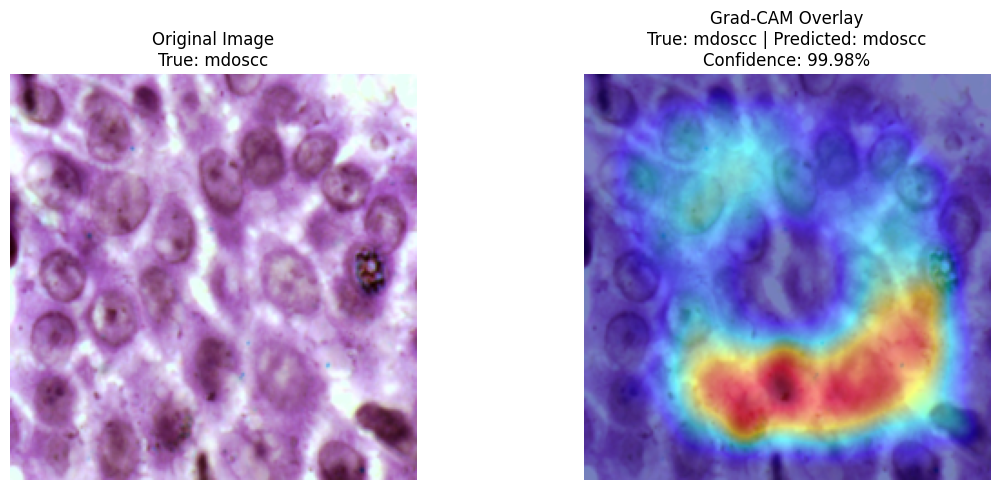

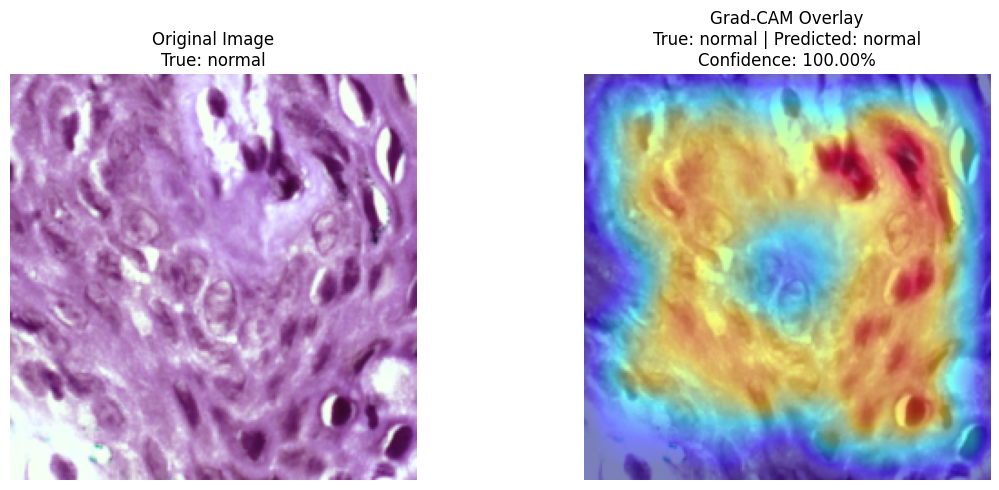

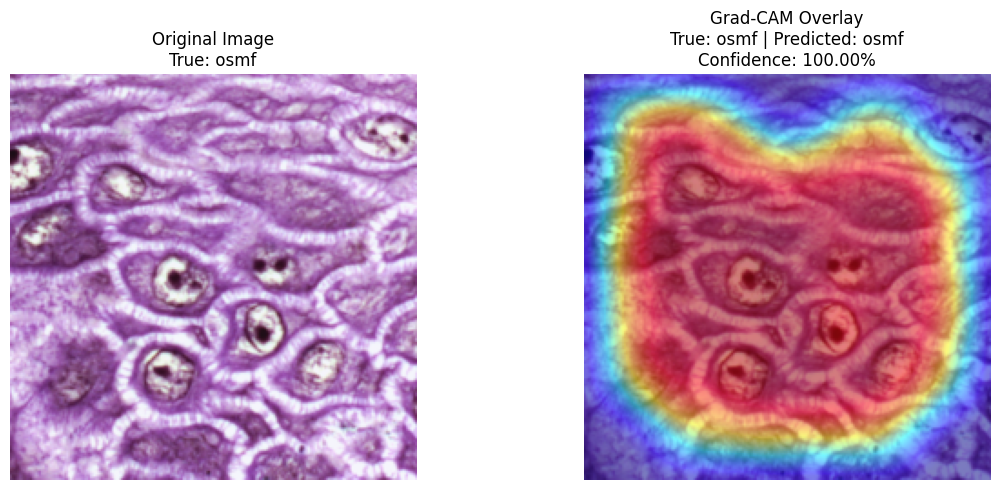

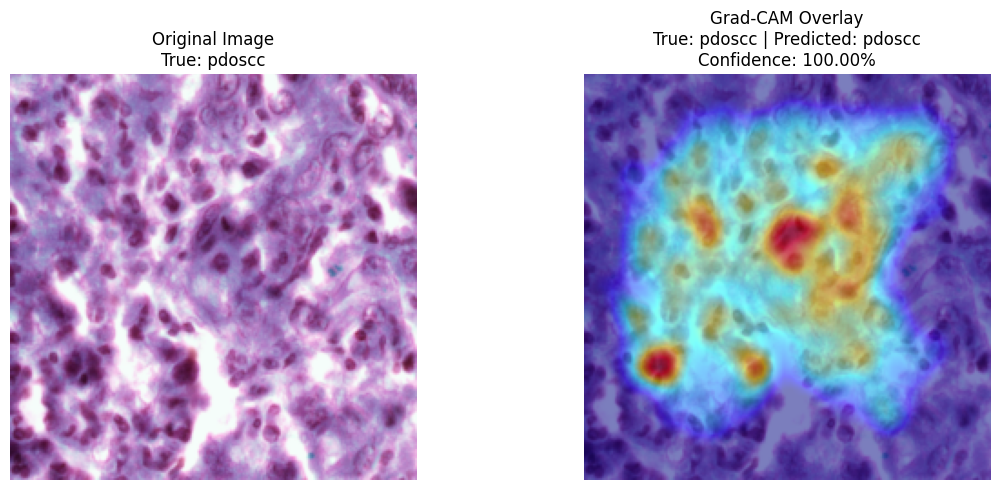

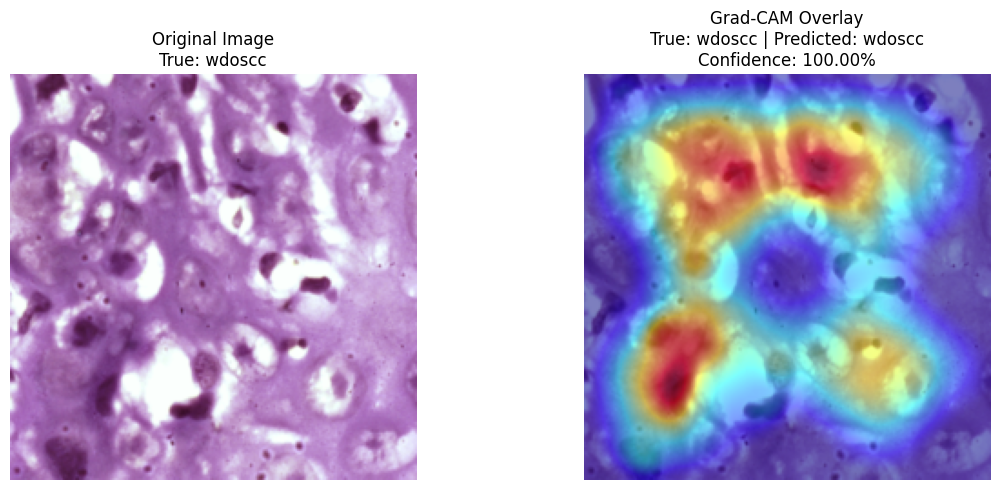

MISCLASSIFIED ORCHID IMAGES


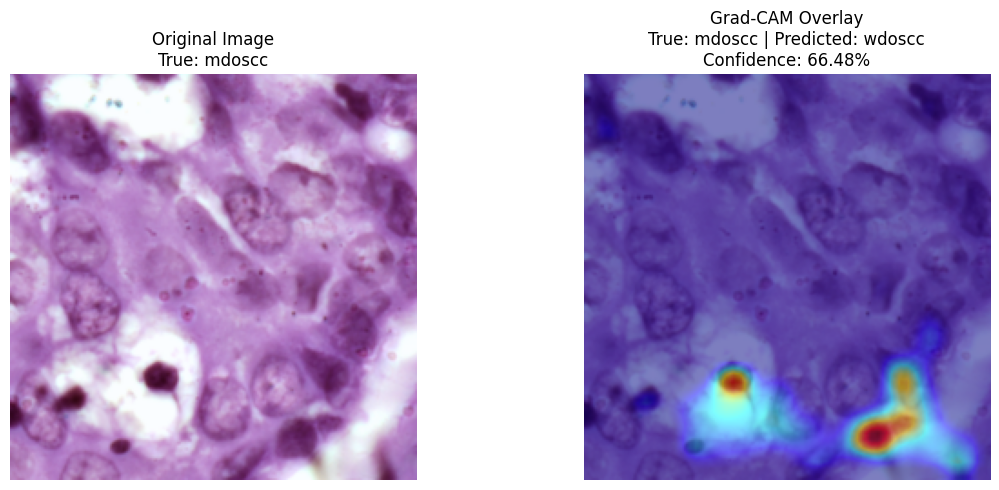

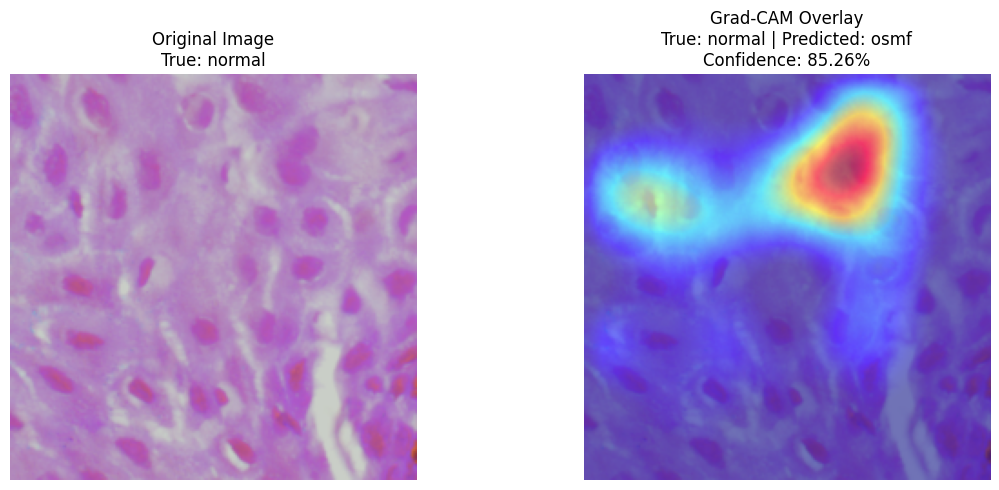

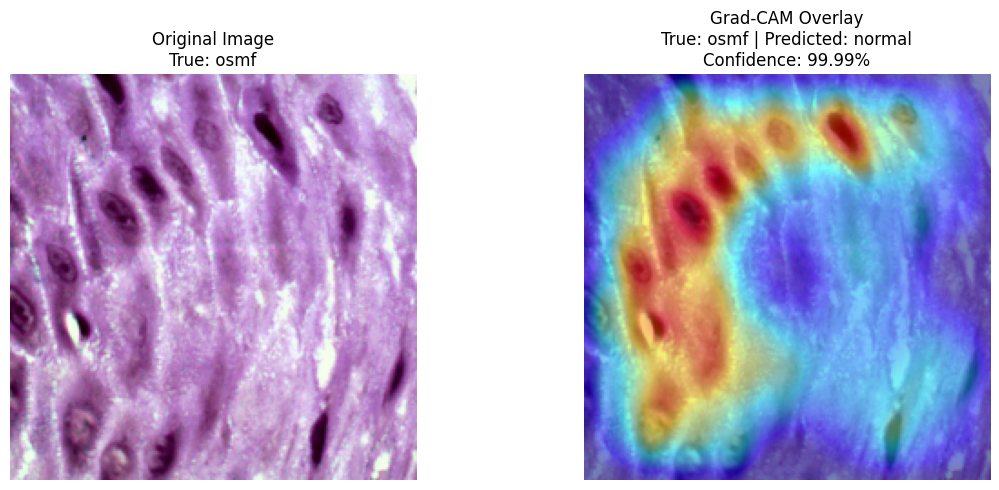

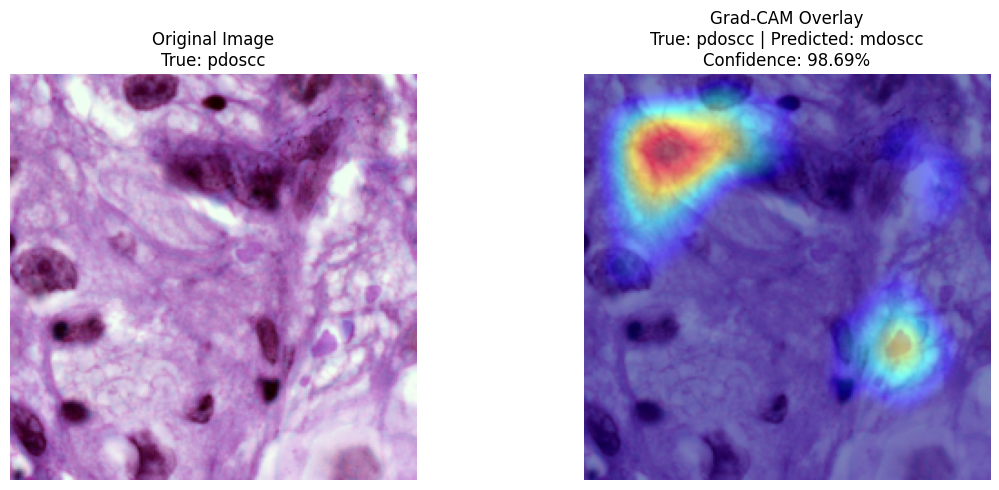

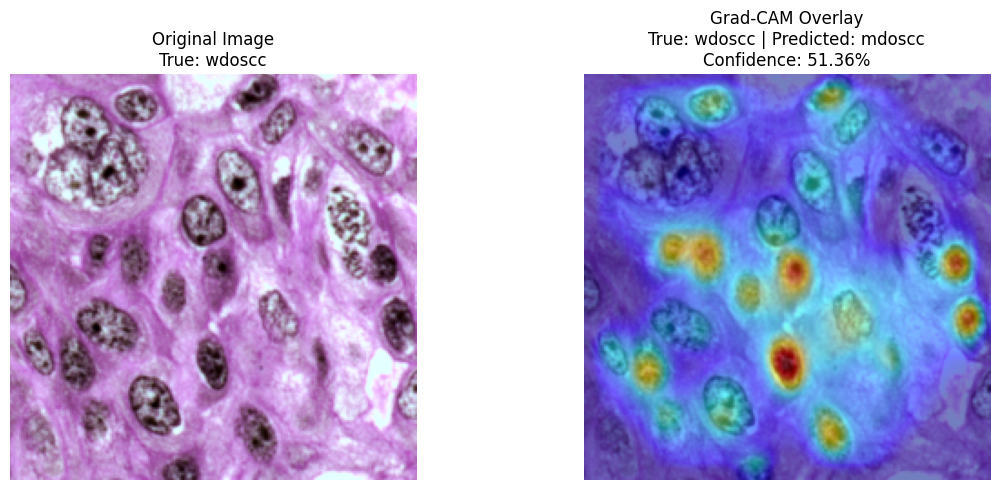

In [149]:
# ============================================================
# DISPLAY GRAD-CAM OVERLAY IMAGES
# ============================================================

def display_gradcam_results(results, title):

    print("=" * 80)
    print(title)
    print("=" * 80)

    for class_id, result in results.items():

        original_image = result[0]
        overlay_image  = result[1]
        true_label     = result[2]
        pred_label     = result[3]
        confidence     = result[4]

        plt.figure(figsize=(12, 5))

        # ----------------------------------------------------
        # Original
        # ----------------------------------------------------

        plt.subplot(1, 2, 1)

        plt.imshow(original_image)

        plt.title(
            f"Original Image\n"
            f"True: {CLASS_NAMES[true_label]}"
        )

        plt.axis("off")

        # ----------------------------------------------------
        # Grad-CAM Overlay
        # ----------------------------------------------------

        plt.subplot(1, 2, 2)

        plt.imshow(overlay_image)

        plt.title(
            f"Grad-CAM Overlay\n"
            f"True: {CLASS_NAMES[true_label]} | "
            f"Predicted: {CLASS_NAMES[pred_label]}\n"
            f"Confidence: {confidence * 100:.2f}%"
        )

        plt.axis("off")

        plt.tight_layout()
        plt.show()


# ============================================================
# CORRECT
# ============================================================

display_gradcam_results(
    correct_results,
    "CORRECTLY CLASSIFIED ORCHID IMAGES"
)


# ============================================================
# MISCLASSIFIED
# ============================================================

display_gradcam_results(
    wrong_results,
    "MISCLASSIFIED ORCHID IMAGES"
)

In [150]:
# ============================================================
# SAVE GRAD-CAM OVERLAY IMAGES
# ============================================================

import os
from PIL import Image

SAVE_DIR = "/kaggle/working/orchid_gradcam"

CORRECT_DIR = os.path.join(
    SAVE_DIR,
    "correct"
)

WRONG_DIR = os.path.join(
    SAVE_DIR,
    "misclassified"
)

os.makedirs(CORRECT_DIR, exist_ok=True)
os.makedirs(WRONG_DIR, exist_ok=True)


# ============================================================
# SAVE FUNCTION
# ============================================================

def save_gradcam_results(results, save_dir, prefix):

    for class_id, result in results.items():

        overlay_image = result[1]

        true_label = result[2]
        pred_label = result[3]
        confidence = result[4]

        filename = (
            f"{prefix}_"
            f"true_{CLASS_NAMES[true_label]}_"
            f"pred_{CLASS_NAMES[pred_label]}_"
            f"{confidence * 100:.2f}.png"
        )

        path = os.path.join(
            save_dir,
            filename
        )

        # show_cam_on_image returns RGB uint8 image
        Image.fromarray(
            overlay_image
        ).save(path)

        print("Saved:", path)


# ============================================================
# SAVE CORRECT
# ============================================================

save_gradcam_results(
    correct_results,
    CORRECT_DIR,
    "correct"
)


# ============================================================
# SAVE MISCLASSIFIED
# ============================================================

save_gradcam_results(
    wrong_results,
    WRONG_DIR,
    "wrong"
)


print()
print("=" * 70)
print("GRAD-CAM OVERLAYS SAVED")
print("=" * 70)
print("Location:", SAVE_DIR)

Saved: /kaggle/working/orchid_gradcam/correct/correct_true_mdoscc_pred_mdoscc_99.98.png
Saved: /kaggle/working/orchid_gradcam/correct/correct_true_normal_pred_normal_100.00.png
Saved: /kaggle/working/orchid_gradcam/correct/correct_true_osmf_pred_osmf_100.00.png
Saved: /kaggle/working/orchid_gradcam/correct/correct_true_pdoscc_pred_pdoscc_100.00.png
Saved: /kaggle/working/orchid_gradcam/correct/correct_true_wdoscc_pred_wdoscc_100.00.png
Saved: /kaggle/working/orchid_gradcam/misclassified/wrong_true_mdoscc_pred_wdoscc_66.48.png
Saved: /kaggle/working/orchid_gradcam/misclassified/wrong_true_normal_pred_osmf_85.26.png
Saved: /kaggle/working/orchid_gradcam/misclassified/wrong_true_osmf_pred_normal_99.99.png
Saved: /kaggle/working/orchid_gradcam/misclassified/wrong_true_pdoscc_pred_mdoscc_98.69.png
Saved: /kaggle/working/orchid_gradcam/misclassified/wrong_true_wdoscc_pred_mdoscc_51.36.png

GRAD-CAM OVERLAYS SAVED
Location: /kaggle/working/orchid_gradcam


In [1]:
# ============================================================
# FIND ORCHID HYBRID STAGE 2 CHECKPOINT
# ============================================================

import os

print("=" * 70)
print("SEARCHING /kaggle/input FOR STAGE 2 CHECKPOINT")
print("=" * 70)

stage2_files = []

for root, dirs, files in os.walk("/kaggle/input"):
    for file in files:
        if file.endswith(".pth") and (
            "stage2" in file.lower()
            or "hybrid" in file.lower()
        ):
            full_path = os.path.join(root, file)
            stage2_files.append(full_path)

for path in stage2_files:
    size_mb = os.path.getsize(path) / (1024 ** 2)
    print(f"{size_mb:.2f} MB  →  {path}")

print("=" * 70)

SEARCHING /kaggle/input FOR STAGE 2 CHECKPOINT
581.80 MB  →  /kaggle/input/datasets/mahrukh05/hybrid-stage-2/best_orchid_hybrid_stage2.pth
373.49 MB  →  /kaggle/input/datasets/mahrukh05/hybrid-stage-1/best_orchid_hybrid_stage1 (3).pth


In [2]:
# ============================================================
# SELECT STAGE 2 CHECKPOINT
# ============================================================

if len(stage2_files) == 0:
    raise FileNotFoundError(
        "No Stage 2 Hybrid .pth checkpoint found in /kaggle/input"
    )

if len(stage2_files) > 1:
    print("Multiple possible checkpoints found:")
    for i, path in enumerate(stage2_files):
        print(i, ":", path)

    # Prefer filenames containing stage2
    preferred = [
        p for p in stage2_files
        if "stage2" in os.path.basename(p).lower()
    ]

    if len(preferred) > 0:
        STAGE2_CHECKPOINT = preferred[0]
    else:
        STAGE2_CHECKPOINT = stage2_files[0]

else:
    STAGE2_CHECKPOINT = stage2_files[0]

print("✓ Stage 2 checkpoint selected:")
print(STAGE2_CHECKPOINT)

Multiple possible checkpoints found:
0 : /kaggle/input/datasets/mahrukh05/hybrid-stage-2/best_orchid_hybrid_stage2.pth
1 : /kaggle/input/datasets/mahrukh05/hybrid-stage-1/best_orchid_hybrid_stage1 (3).pth
✓ Stage 2 checkpoint selected:
/kaggle/input/datasets/mahrukh05/hybrid-stage-2/best_orchid_hybrid_stage2.pth


In [91]:
# ============================================================
# LOAD ORCHID HYBRID STAGE 2
# ============================================================

import torch

hybrid_model = SwinCLIPHybrid(
    swin_encoder=swin_encoder,
    text_embeddings=text_embeddings,
    freeze_encoder=False
).to(device)

checkpoint = torch.load(
    STAGE2_CHECKPOINT,
    map_location=device
)

print("Checkpoint type:", type(checkpoint))

# ------------------------------------------------------------
# Handle checkpoint dictionary
# ------------------------------------------------------------

if isinstance(checkpoint, dict) and "model_state_dict" in checkpoint:

    hybrid_model.load_state_dict(
        checkpoint["model_state_dict"],
        strict=True
    )

    print("✓ model_state_dict loaded")

    if "epoch" in checkpoint:
        print("Checkpoint epoch:", checkpoint["epoch"])

    if "val_accuracy" in checkpoint:
        print(
            "Best validation accuracy:",
            f"{checkpoint['val_accuracy'] * 100:.2f}%"
        )

else:

    hybrid_model.load_state_dict(
        checkpoint,
        strict=True
    )

    print("✓ State dictionary loaded")

hybrid_model.eval()

print("✓ Stage 2 Hybrid model loaded successfully")

Checkpoint type: <class 'dict'>
✓ model_state_dict loaded
Checkpoint epoch: 10
Best validation accuracy: 96.19%
✓ Stage 2 Hybrid model loaded successfully


In [92]:
# ============================================================
# VERIFY STAGE 2 HYBRID
# ============================================================

dummy_input = torch.randn(
    1,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():

    output = hybrid_model(dummy_input)

print("=" * 70)
print("STAGE 2 HYBRID VERIFICATION")
print("=" * 70)

print("Input :", dummy_input.shape)
print("Logits:", output["logits"].shape)

print(
    "Decoder features:",
    output["decoder_features"].shape
)

print(
    "Semantic Stage 1:",
    output["semantic_features"]["stage1"].shape
)

print(
    "Semantic Stage 2:",
    output["semantic_features"]["stage2"].shape
)

print(
    "Semantic Stage 3:",
    output["semantic_features"]["stage3"].shape
)

print(
    "Semantic Stage 4:",
    output["semantic_features"]["stage4"].shape
)

print("=" * 70)

STAGE 2 HYBRID VERIFICATION
Input : torch.Size([1, 3, 224, 224])
Logits: torch.Size([1, 5])
Decoder features: torch.Size([1, 512, 56, 56])
Semantic Stage 1: torch.Size([1, 56, 56, 512])
Semantic Stage 2: torch.Size([1, 28, 28, 512])
Semantic Stage 3: torch.Size([1, 14, 14, 512])
Semantic Stage 4: torch.Size([1, 7, 7, 512])


In [93]:
!pip install -q grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 81.4 MB/s eta 0:00:00:00:010:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [94]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

print("✓ Grad-CAM imported")

✓ Grad-CAM imported


In [95]:
# ============================================================
# GRAD-CAM TARGET LAYERS
# ============================================================

target_layers_dict = {

    # Deep/coarse decoder representation
    "decoder3": hybrid_model.decoder.decoder3,

    # Intermediate representation
    "decoder2": hybrid_model.decoder.decoder2,

    # Final/high-resolution representation
    "decoder1": hybrid_model.decoder.decoder1
}

print("=" * 70)
print("GRAD-CAM TARGET LAYERS")
print("=" * 70)

for name, layer in target_layers_dict.items():

    print(f"{name}:")
    print(layer)
    print()

GRAD-CAM TARGET LAYERS
decoder3:
ResidualConvBlock(
  (block): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (activation): GELU(approximate='none')
)

decoder2:
ResidualConvBlock(
  (block): Sequential(
    (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): GELU(approximate='none')
    (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (activation): GELU(approximate='non

In [96]:
# ============================================================
# MULTI-LAYER GRAD-CAM
# ============================================================

import numpy as np

mean = np.array([
    0.485,
    0.456,
    0.406
])

std = np.array([
    0.229,
    0.224,
    0.225
])


def generate_multilayer_gradcam(sample):

    input_image = sample["image"].to(device)

    true_label = sample["true_label"]
    pred_label = sample["pred_label"]
    confidence = sample["confidence"]

    targets = [
        ClassifierOutputTarget(pred_label)
    ]

    # --------------------------------------------------------
    # Recover original RGB image
    # --------------------------------------------------------

    rgb_image = (
        input_image[0]
        .detach()
        .cpu()
        .numpy()
    )

    rgb_image = np.transpose(
        rgb_image,
        (1, 2, 0)
    )

    rgb_image = (
        rgb_image * std + mean
    )

    rgb_image = np.clip(
        rgb_image,
        0,
        1
    ).astype(np.float32)

    results = {}

    # --------------------------------------------------------
    # Generate CAM from every target layer
    # --------------------------------------------------------

    for layer_name, target_layer in target_layers_dict.items():

        cam = GradCAM(
            model=hybrid_model,
            target_layers=[target_layer]
        )

        grayscale_cam = cam(
            input_tensor=input_image,
            targets=targets
        )[0]

        visualization = show_cam_on_image(
            rgb_image,
            grayscale_cam,
            use_rgb=True
        )

        results[layer_name] = {
            "grayscale_cam": grayscale_cam,
            "visualization": visualization
        }

        print(
            f"✓ {layer_name} CAM generated | "
            f"shape: {grayscale_cam.shape}"
        )

    return {
        "rgb_image": rgb_image,
        "results": results,
        "true_label": true_label,
        "pred_label": pred_label,
        "confidence": confidence
    }

✓ Grad-CAM target layer:
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

SELECTED GRAD-CAM SAMPLE
True      : normal
Predicted : normal
Confidence: 100.00%

CAM shape: (224, 224)


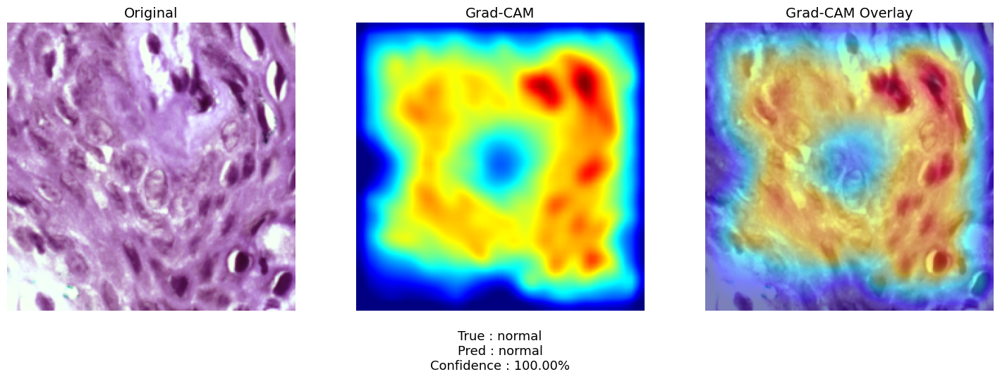

In [98]:
# ============================================================
# ORCHID HYBRID — RESEARCH STYLE GRAD-CAM
# Original | Grad-CAM | Overlay
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# ============================================================
# CLASS NAMES
# ============================================================

CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]


# ============================================================
# IMAGE NET NORMALIZATION
# ============================================================

mean = np.array([
    0.485,
    0.456,
    0.406
])

std = np.array([
    0.229,
    0.224,
    0.225
])


# ============================================================
# MODEL WRAPPER
# Hybrid model returns a dictionary,
# Grad-CAM needs logits directly.
# ============================================================

class HybridCAMWrapper(torch.nn.Module):

    def __init__(self, model):

        super().__init__()

        self.model = model

    def forward(self, x):

        output = self.model(x)

        return output["logits"]


cam_model = HybridCAMWrapper(
    hybrid_model
).to(device)

cam_model.eval()


# ============================================================
# TARGET LAYER
# ============================================================

target_layer = hybrid_model.decoder.decoder1.block[3]

print("✓ Grad-CAM target layer:")
print(target_layer)


# ============================================================
# FIND A CORRECT NORMAL IMAGE
# ============================================================

hybrid_model.eval()

selected_image = None
selected_true = None
selected_pred = None
selected_confidence = None


with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = hybrid_model(images)

        logits = outputs["logits"]

        probabilities = torch.softmax(
            logits,
            dim=1
        )

        predictions = probabilities.argmax(
            dim=1
        )

        confidences = probabilities.max(
            dim=1
        ).values


        # ----------------------------------------------------
        # Find correct NORMAL sample
        # normal = class 1
        # ----------------------------------------------------

        for i in range(len(labels)):

            if (
                labels[i].item() == 1
                and
                predictions[i].item() == 1
            ):

                selected_image = images[i:i+1].clone()

                selected_true = labels[i].item()

                selected_pred = predictions[i].item()

                selected_confidence = confidences[i].item()

                break


        if selected_image is not None:
            break


if selected_image is None:

    raise RuntimeError(
        "Could not find a correctly classified normal image."
    )


print()
print("=" * 70)
print("SELECTED GRAD-CAM SAMPLE")
print("=" * 70)

print(
    "True      :",
    CLASS_NAMES[selected_true]
)

print(
    "Predicted :",
    CLASS_NAMES[selected_pred]
)

print(
    "Confidence:",
    f"{selected_confidence * 100:.2f}%"
)


# ============================================================
# GENERATE GRAD-CAM
# ============================================================

targets = [
    ClassifierOutputTarget(
        selected_pred
    )
]


cam = GradCAM(
    model=cam_model,
    target_layers=[target_layer]
)


grayscale_cam = cam(
    input_tensor=selected_image,
    targets=targets
)[0]


print()
print("CAM shape:", grayscale_cam.shape)


# ============================================================
# CONVERT IMAGE BACK TO RGB
# ============================================================

rgb_image = (
    selected_image[0]
    .detach()
    .cpu()
    .numpy()
)

rgb_image = np.transpose(
    rgb_image,
    (1, 2, 0)
)


# Undo ImageNet normalization

rgb_image = (
    rgb_image * std + mean
)

rgb_image = np.clip(
    rgb_image,
    0,
    1
)


# ============================================================
# CREATE GRAD-CAM HEATMAP
# ============================================================

heatmap = show_cam_on_image(
    np.zeros_like(rgb_image),
    grayscale_cam,
    use_rgb=True
)


# ============================================================
# CREATE OVERLAY
# ============================================================

overlay = show_cam_on_image(
    rgb_image.astype(np.float32),
    grayscale_cam,
    use_rgb=True
)


# ============================================================
# RESEARCH STYLE FIGURE
# ============================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(15, 5)
)


# ------------------------------------------------------------
# ORIGINAL
# ------------------------------------------------------------

axes[0].imshow(
    rgb_image
)

axes[0].set_title(
    "Original",
    fontsize=14
)

axes[0].axis("off")


# ------------------------------------------------------------
# GRAD-CAM
# ------------------------------------------------------------

axes[1].imshow(
    heatmap
)

axes[1].set_title(
    "Grad-CAM",
    fontsize=14
)

axes[1].axis("off")


# ------------------------------------------------------------
# OVERLAY
# ------------------------------------------------------------

axes[2].imshow(
    overlay
)

axes[2].set_title(
    "Grad-CAM Overlay",
    fontsize=14
)

axes[2].axis("off")


# ============================================================
# INFORMATION UNDER FIGURE
# ============================================================

fig.text(
    0.50,
    0.035,
    (
        f"True : {CLASS_NAMES[selected_true]}\n"
        f"Pred : {CLASS_NAMES[selected_pred]}\n"
        f"Confidence : {selected_confidence * 100:.2f}%"
    ),
    ha="center",
    va="center",
    fontsize=13
)


plt.tight_layout(
    rect=[0, 0.12, 1, 1]
)

plt.show()

Generating Grad-CAM → Decoder 3
Decoder 3 CAM shape: (224, 224)
Generating Grad-CAM → Decoder 2
Decoder 2 CAM shape: (224, 224)
Generating Grad-CAM → Decoder 1
Decoder 1 CAM shape: (224, 224)


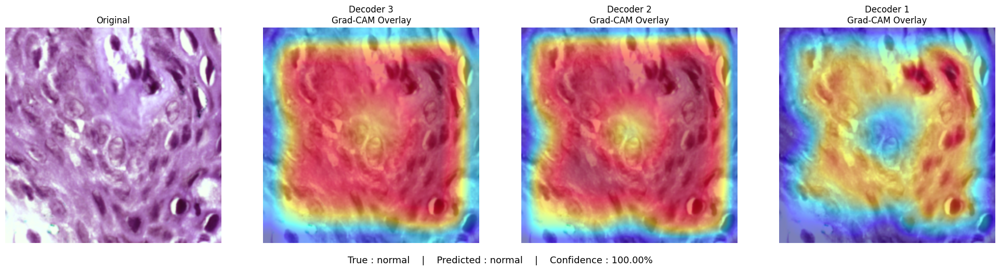

In [99]:
# ============================================================
# ORCHID HYBRID — MULTI-LAYER GRAD-CAM COMPARISON
# ============================================================

target_layers_dict = {

    "Decoder 3": hybrid_model.decoder.decoder3.block[3],

    "Decoder 2": hybrid_model.decoder.decoder2.block[3],

    "Decoder 1": hybrid_model.decoder.decoder1.block[3],

}

cam_results = {}

targets = [
    ClassifierOutputTarget(selected_pred)
]

for layer_name, layer in target_layers_dict.items():

    print(f"Generating Grad-CAM → {layer_name}")

    cam = GradCAM(
        model=cam_model,
        target_layers=[layer]
    )

    grayscale_cam = cam(
        input_tensor=selected_image,
        targets=targets
    )[0]

    cam_results[layer_name] = grayscale_cam

    print(
        layer_name,
        "CAM shape:",
        grayscale_cam.shape
    )


# ============================================================
# ORIGINAL IMAGE
# ============================================================

rgb_image = (
    selected_image[0]
    .detach()
    .cpu()
    .numpy()
)

rgb_image = np.transpose(
    rgb_image,
    (1, 2, 0)
)

rgb_image = (
    rgb_image * std + mean
)

rgb_image = np.clip(
    rgb_image,
    0,
    1
)


# ============================================================
# DISPLAY
# ============================================================

fig, axes = plt.subplots(
    1,
    4,
    figsize=(20, 5)
)

axes[0].imshow(rgb_image)
axes[0].set_title("Original")
axes[0].axis("off")


for idx, (layer_name, grayscale_cam) in enumerate(
    cam_results.items(),
    start=1
):

    overlay = show_cam_on_image(
        rgb_image.astype(np.float32),
        grayscale_cam,
        use_rgb=True
    )

    axes[idx].imshow(overlay)

    axes[idx].set_title(
        f"{layer_name}\nGrad-CAM Overlay"
    )

    axes[idx].axis("off")


fig.text(
    0.50,
    0.025,
    (
        f"True : {CLASS_NAMES[selected_true]}    |    "
        f"Predicted : {CLASS_NAMES[selected_pred]}    |    "
        f"Confidence : {selected_confidence * 100:.2f}%"
    ),
    ha="center",
    fontsize=13
)

plt.tight_layout(
    rect=[0, 0.07, 1, 1]
)

plt.show()

✓ Final Grad-CAM layer:
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

CORRECT SAMPLES FOUND
mdoscc   → mdoscc   | 99.98%
normal   → normal   | 100.00%
osmf     → osmf     | 100.00%
pdoscc   → pdoscc   | 100.00%
wdoscc   → wdoscc   | 100.00%
Generating Grad-CAM → mdoscc
Generating Grad-CAM → normal
Generating Grad-CAM → osmf
Generating Grad-CAM → pdoscc
Generating Grad-CAM → wdoscc


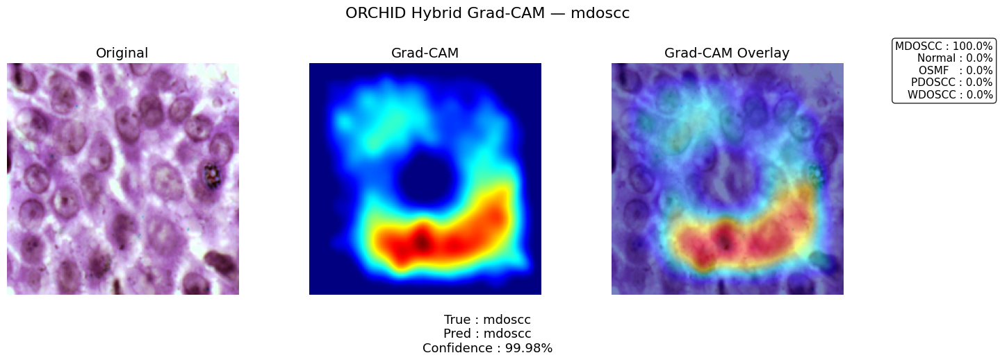

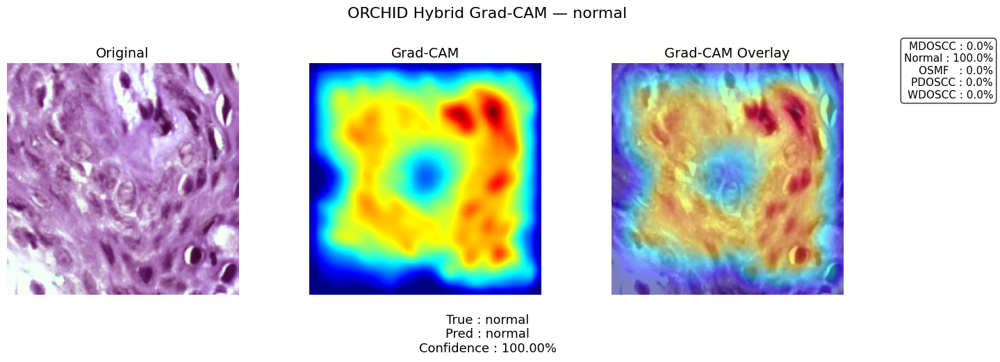

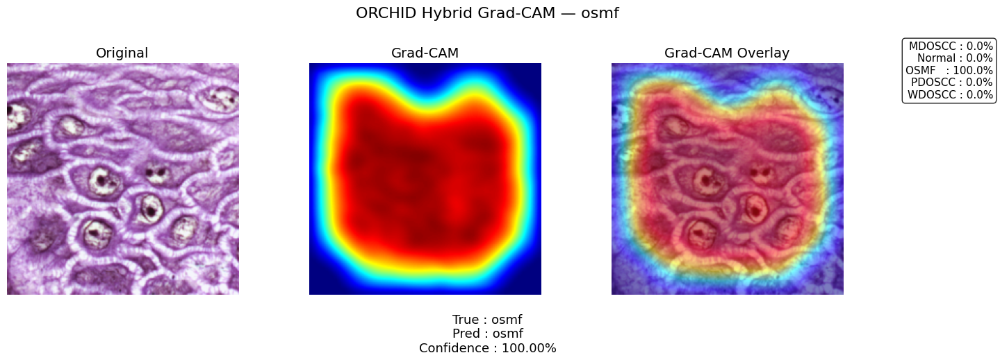

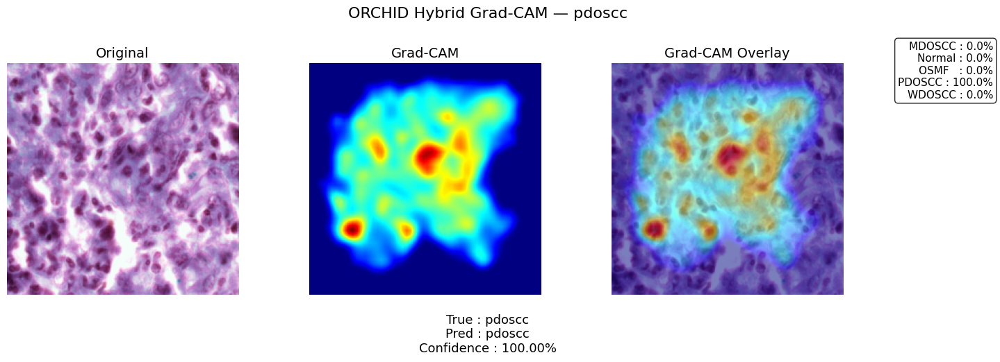

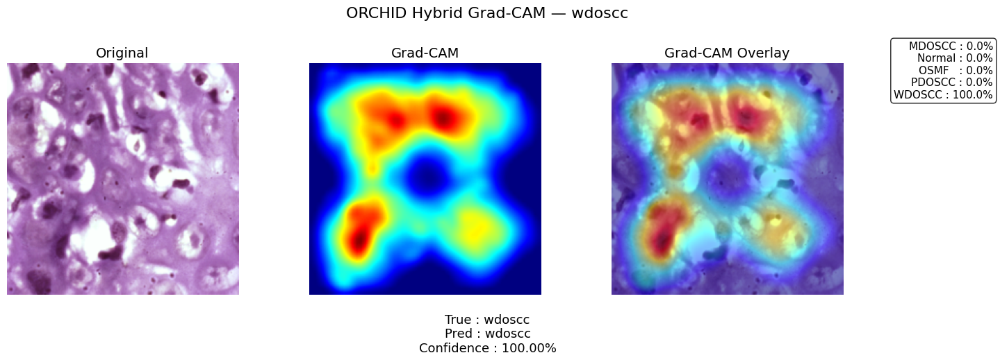


✓ GRAD-CAM GENERATED FOR ALL AVAILABLE CLASSES


In [100]:
# ============================================================
# ORCHID HYBRID — GRAD-CAM FOR ALL 5 CLASSES
# Decoder 1 | Correctly Classified Samples
# Original | Grad-CAM | Grad-CAM Overlay
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# ============================================================
# CLASS NAMES
# ============================================================

CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]


# ============================================================
# IMAGE NET NORMALIZATION
# ============================================================

mean = np.array([
    0.485,
    0.456,
    0.406
])

std = np.array([
    0.229,
    0.224,
    0.225
])


# ============================================================
# GRAD-CAM MODEL WRAPPER
# ============================================================

class HybridCAMWrapper(torch.nn.Module):

    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):

        output = self.model(x)

        return output["logits"]


cam_model = HybridCAMWrapper(
    hybrid_model
).to(device)

cam_model.eval()


# ============================================================
# FINAL SELECTED TARGET LAYER
# Decoder 1
# ============================================================

target_layer = hybrid_model.decoder.decoder1.block[3]

print("✓ Final Grad-CAM layer:")
print(target_layer)


# ============================================================
# FIND ONE CORRECT SAMPLE FOR EACH CLASS
# ============================================================

hybrid_model.eval()

class_samples = {}

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = hybrid_model(images)

        logits = outputs["logits"]

        probabilities = torch.softmax(
            logits,
            dim=1
        )

        predictions = probabilities.argmax(
            dim=1
        )

        confidences = probabilities.max(
            dim=1
        ).values


        for i in range(len(labels)):

            true_class = labels[i].item()
            pred_class = predictions[i].item()

            # ------------------------------------------------
            # Keep only correctly classified samples
            # ------------------------------------------------

            if (
                true_class == pred_class
                and
                true_class not in class_samples
            ):

                class_samples[true_class] = {
                    "image": images[i:i+1].clone(),
                    "true_label": true_class,
                    "pred_label": pred_class,
                    "confidence": confidences[i].item(),
                    "probabilities": probabilities[i].detach().cpu().numpy()
                }


        # ----------------------------------------------------
        # Stop once all 5 classes are found
        # ----------------------------------------------------

        if len(class_samples) == len(CLASS_NAMES):
            break


# ============================================================
# CHECK
# ============================================================

print()
print("=" * 70)
print("CORRECT SAMPLES FOUND")
print("=" * 70)

for class_id in range(len(CLASS_NAMES)):

    if class_id in class_samples:

        sample = class_samples[class_id]

        print(
            f"{CLASS_NAMES[class_id]:8s} → "
            f"{CLASS_NAMES[sample['pred_label']]:8s} | "
            f"{sample['confidence'] * 100:.2f}%"
        )

    else:

        print(
            f"{CLASS_NAMES[class_id]:8s} → "
            "NOT FOUND"
        )


# ============================================================
# GENERATE GRAD-CAM FOR ONE SAMPLE
# ============================================================

def generate_class_gradcam(sample):

    input_image = sample["image"]

    true_label = sample["true_label"]
    pred_label = sample["pred_label"]
    confidence = sample["confidence"]
    probabilities = sample["probabilities"]

    # --------------------------------------------------------
    # Target predicted class
    # --------------------------------------------------------

    targets = [
        ClassifierOutputTarget(pred_label)
    ]

    # --------------------------------------------------------
    # Grad-CAM
    # --------------------------------------------------------

    cam = GradCAM(
        model=cam_model,
        target_layers=[target_layer]
    )

    grayscale_cam = cam(
        input_tensor=input_image,
        targets=targets
    )[0]

    # --------------------------------------------------------
    # Convert image to RGB
    # --------------------------------------------------------

    rgb_image = (
        input_image[0]
        .detach()
        .cpu()
        .numpy()
    )

    rgb_image = np.transpose(
        rgb_image,
        (1, 2, 0)
    )

    # Undo ImageNet normalization

    rgb_image = (
        rgb_image * std + mean
    )

    rgb_image = np.clip(
        rgb_image,
        0,
        1
    )

    # --------------------------------------------------------
    # Standalone Grad-CAM
    # --------------------------------------------------------

    heatmap = show_cam_on_image(
        np.zeros_like(rgb_image),
        grayscale_cam,
        use_rgb=True
    )

    # --------------------------------------------------------
    # Overlay
    # --------------------------------------------------------

    overlay = show_cam_on_image(
        rgb_image.astype(np.float32),
        grayscale_cam,
        use_rgb=True
    )

    return (
        rgb_image,
        heatmap,
        overlay,
        true_label,
        pred_label,
        confidence,
        probabilities
    )


# ============================================================
# GENERATE ALL 5
# ============================================================

gradcam_results = {}

for class_id in range(len(CLASS_NAMES)):

    if class_id not in class_samples:
        continue

    print(
        f"Generating Grad-CAM → "
        f"{CLASS_NAMES[class_id]}"
    )

    gradcam_results[class_id] = generate_class_gradcam(
        class_samples[class_id]
    )


# ============================================================
# DISPLAY ALL 5 CLASSES
# Each class gets its own research-style figure
# ============================================================

for class_id in range(len(CLASS_NAMES)):

    if class_id not in gradcam_results:
        continue

    (
        rgb_image,
        heatmap,
        overlay,
        true_label,
        pred_label,
        confidence,
        probabilities
    ) = gradcam_results[class_id]


    # ========================================================
    # FIGURE
    # ========================================================

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(15, 5)
    )


    # --------------------------------------------------------
    # ORIGINAL
    # --------------------------------------------------------

    axes[0].imshow(
        rgb_image
    )

    axes[0].set_title(
        "Original",
        fontsize=14
    )

    axes[0].axis("off")


    # --------------------------------------------------------
    # GRAD-CAM
    # --------------------------------------------------------

    axes[1].imshow(
        heatmap
    )

    axes[1].set_title(
        "Grad-CAM",
        fontsize=14
    )

    axes[1].axis("off")


    # --------------------------------------------------------
    # OVERLAY
    # --------------------------------------------------------

    axes[2].imshow(
        overlay
    )

    axes[2].set_title(
        "Grad-CAM Overlay",
        fontsize=14
    )

    axes[2].axis("off")


    # ========================================================
    # PROBABILITIES
    # ========================================================

    probability_text = (
        f"MDOSCC : {probabilities[0] * 100:.1f}%\n"
        f"Normal : {probabilities[1] * 100:.1f}%\n"
        f"OSMF   : {probabilities[2] * 100:.1f}%\n"
        f"PDOSCC : {probabilities[3] * 100:.1f}%\n"
        f"WDOSCC : {probabilities[4] * 100:.1f}%"
    )


    # --------------------------------------------------------
    # Probability box
    # --------------------------------------------------------

    fig.text(
        0.985,
        0.88,
        probability_text,
        ha="right",
        va="top",
        fontsize=11,
        bbox=dict(
            boxstyle="round",
            facecolor="white",
            alpha=0.85
        )
    )


    # ========================================================
    # INFORMATION
    # ========================================================

    fig.text(
        0.50,
        0.035,
        (
            f"True : {CLASS_NAMES[true_label]}\n"
            f"Pred : {CLASS_NAMES[pred_label]}\n"
            f"Confidence : {confidence * 100:.2f}%"
        ),
        ha="center",
        va="center",
        fontsize=13
    )


    plt.suptitle(
        f"ORCHID Hybrid Grad-CAM — {CLASS_NAMES[true_label]}",
        fontsize=16
    )


    plt.tight_layout(
        rect=[0, 0.12, 0.88, 0.92]
    )

    plt.show()


print()
print("=" * 70)
print("✓ GRAD-CAM GENERATED FOR ALL AVAILABLE CLASSES")
print("=" * 70)

✓ Grad-CAM target layer:
Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

SEARCHING FOR MISCLASSIFIED EXAMPLES

MISCLASSIFIED SAMPLES FOUND
mdoscc → wdoscc | 66.48%
normal → osmf | 85.26%
osmf → normal | 99.99%
pdoscc → mdoscc | 98.69%
wdoscc → mdoscc | 51.36%


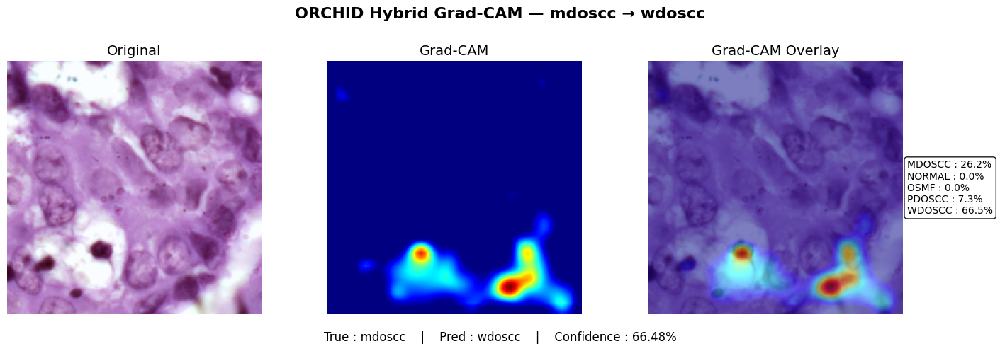

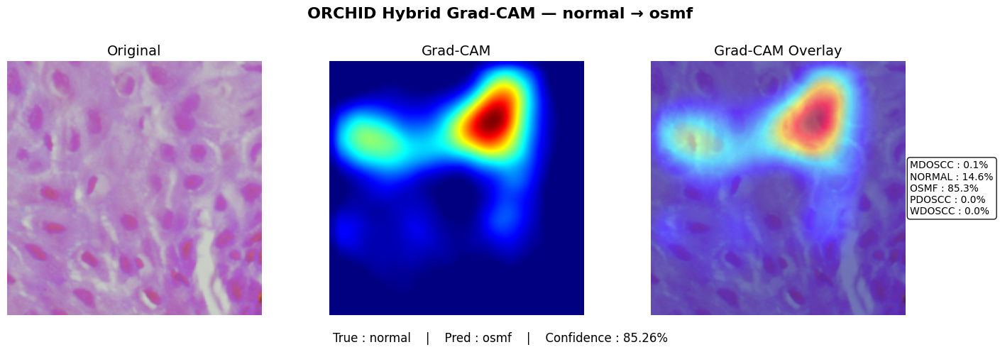

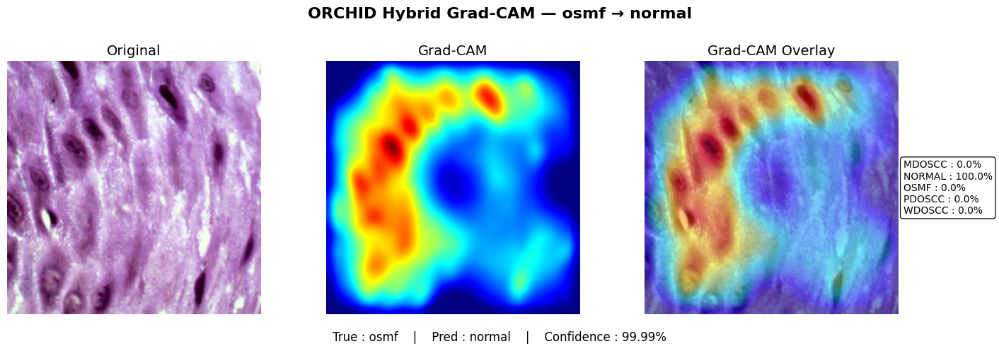

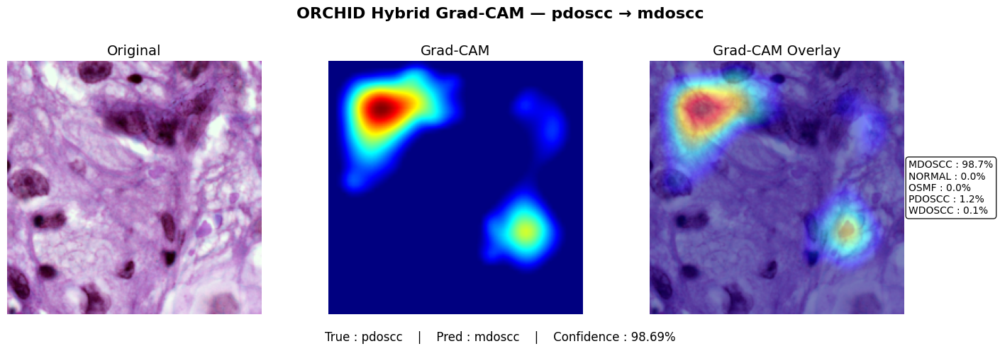

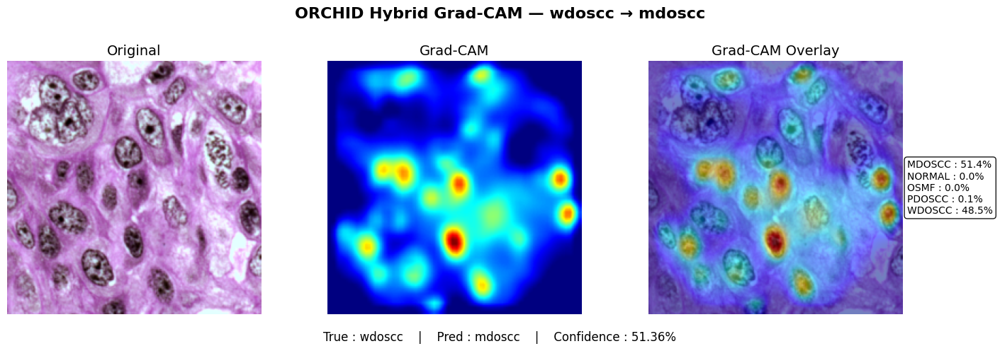


✓ MISCLASSIFIED GRAD-CAM EXAMPLES GENERATED


In [102]:
# ============================================================
# ORCHID HYBRID — MISCLASSIFIED GRAD-CAM
# Original | Grad-CAM | Overlay | Class Probabilities
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# ============================================================
# CLASS NAMES
# ============================================================

CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]


# ============================================================
# IMAGENET NORMALIZATION
# ============================================================

mean = np.array([
    0.485,
    0.456,
    0.406
])

std = np.array([
    0.229,
    0.224,
    0.225
])


# ============================================================
# MODEL WRAPPER
# ============================================================

class HybridCAMWrapper(torch.nn.Module):

    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):

        output = self.model(x)

        return output["logits"]


cam_model = HybridCAMWrapper(
    hybrid_model
).to(device)

cam_model.eval()


# ============================================================
# TARGET LAYER
# ============================================================

target_layer = hybrid_model.decoder.decoder1.block[3]

print("✓ Grad-CAM target layer:")
print(target_layer)


# ============================================================
# SEARCH FOR MISCLASSIFIED EXAMPLES
# ============================================================

print()
print("=" * 70)
print("SEARCHING FOR MISCLASSIFIED EXAMPLES")
print("=" * 70)


misclassified_examples = {}


hybrid_model.eval()


with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = hybrid_model(images)

        logits = outputs["logits"]

        probabilities = torch.softmax(
            logits,
            dim=1
        )

        predictions = probabilities.argmax(
            dim=1
        )

        confidences = probabilities.max(
            dim=1
        ).values


        # ----------------------------------------------------
        # Find misclassified samples
        # ----------------------------------------------------

        for i in range(len(labels)):

            true_class = labels[i].item()
            predicted_class = predictions[i].item()

            if true_class != predicted_class:

                # Keep only one example for each TRUE class
                if true_class not in misclassified_examples:

                    misclassified_examples[true_class] = {

                        "image":
                            images[i:i+1].clone(),

                        "true_label":
                            true_class,

                        "pred_label":
                            predicted_class,

                        "confidence":
                            confidences[i].item(),

                        # IMPORTANT:
                        # Keep ALL 5 probabilities
                        "probabilities":
                            probabilities[i]
                            .detach()
                            .cpu()
                            .numpy()
                    }


        # Stop when we have one error for every class
        if len(misclassified_examples) == len(CLASS_NAMES):
            break


# ============================================================
# PRINT FOUND EXAMPLES
# ============================================================

print()
print("=" * 70)
print("MISCLASSIFIED SAMPLES FOUND")
print("=" * 70)


for class_id in sorted(misclassified_examples):

    sample = misclassified_examples[class_id]

    print(
        f"{CLASS_NAMES[sample['true_label']]} → "
        f"{CLASS_NAMES[sample['pred_label']]} | "
        f"{sample['confidence'] * 100:.2f}%"
    )


# ============================================================
# GENERATE GRAD-CAM FOR EACH MISCLASSIFIED SAMPLE
# ============================================================

for class_id in sorted(misclassified_examples):

    sample = misclassified_examples[class_id]

    image = sample["image"]

    true_label = sample["true_label"]

    pred_label = sample["pred_label"]

    confidence = sample["confidence"]

    # --------------------------------------------------------
    # FULL 5-CLASS PROBABILITY VECTOR
    # --------------------------------------------------------

    probabilities = sample["probabilities"]

    # Safety check
    probabilities = np.asarray(
        probabilities
    ).reshape(-1)


    # --------------------------------------------------------
    # Grad-CAM target = predicted class
    # --------------------------------------------------------

    targets = [
        ClassifierOutputTarget(
            pred_label
        )
    ]


    cam = GradCAM(
        model=cam_model,
        target_layers=[target_layer]
    )


    grayscale_cam = cam(
        input_tensor=image,
        targets=targets
    )[0]


    # --------------------------------------------------------
    # Convert normalized tensor → RGB image
    # --------------------------------------------------------

    rgb_image = (
        image[0]
        .detach()
        .cpu()
        .numpy()
    )

    rgb_image = np.transpose(
        rgb_image,
        (1, 2, 0)
    )


    # Undo ImageNet normalization

    rgb_image = (
        rgb_image * std + mean
    )

    rgb_image = np.clip(
        rgb_image,
        0,
        1
    )


    # --------------------------------------------------------
    # Grad-CAM HEATMAP
    # --------------------------------------------------------

    heatmap = show_cam_on_image(
        np.zeros_like(rgb_image),
        grayscale_cam,
        use_rgb=True
    )


    # --------------------------------------------------------
    # Grad-CAM OVERLAY
    # --------------------------------------------------------

    overlay = show_cam_on_image(
        rgb_image.astype(np.float32),
        grayscale_cam,
        use_rgb=True
    )


    # ========================================================
    # FIGURE
    # ========================================================

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(15, 5)
    )


    # --------------------------------------------------------
    # ORIGINAL
    # --------------------------------------------------------

    axes[0].imshow(
        rgb_image
    )

    axes[0].set_title(
        "Original",
        fontsize=14
    )

    axes[0].axis("off")


    # --------------------------------------------------------
    # GRAD-CAM
    # --------------------------------------------------------

    axes[1].imshow(
        heatmap
    )

    axes[1].set_title(
        "Grad-CAM",
        fontsize=14
    )

    axes[1].axis("off")


    # --------------------------------------------------------
    # OVERLAY
    # --------------------------------------------------------

    axes[2].imshow(
        overlay
    )

    axes[2].set_title(
        "Grad-CAM Overlay",
        fontsize=14
    )

    axes[2].axis("off")


    # ========================================================
    # TITLE
    # ========================================================

    fig.suptitle(
        (
            f"ORCHID Hybrid Grad-CAM — "
            f"{CLASS_NAMES[true_label]} → "
            f"{CLASS_NAMES[pred_label]}"
        ),
        fontsize=16,
        fontweight="bold"
    )


    # ========================================================
    # PROBABILITY BOX
    # ========================================================

    probability_text = "\n".join(
        [
            f"{CLASS_NAMES[j].upper()} : "
            f"{probabilities[j] * 100:.1f}%"
            for j in range(len(CLASS_NAMES))
        ]
    )


    axes[2].text(
        1.02,
        0.5,
        probability_text,
        transform=axes[2].transAxes,
        fontsize=10,
        verticalalignment="center",
        bbox=dict(
            boxstyle="round",
            facecolor="white",
            edgecolor="black",
            alpha=0.9
        )
    )


    # ========================================================
    # INFORMATION
    # ========================================================

    fig.text(
        0.50,
        0.035,
        (
            f"True : {CLASS_NAMES[true_label]}    |    "
            f"Pred : {CLASS_NAMES[pred_label]}    |    "
            f"Confidence : {confidence * 100:.2f}%"
        ),
        ha="center",
        fontsize=12
    )


    plt.tight_layout(
        rect=[0, 0.08, 1, 0.93]
    )

    plt.show()


print()
print("=" * 70)
print("✓ MISCLASSIFIED GRAD-CAM EXAMPLES GENERATED")
print("=" * 70)

In [76]:
# ============================================================
# REBUILD NDB-PRETRAINED SWIN BACKBONE
# ============================================================

import torch
import torch.nn as nn
import timm

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)


# ------------------------------------------------------------
# NDB Swin checkpoint
# ------------------------------------------------------------

NDB_SWIN_CHECKPOINT = (
    "/kaggle/input/datasets/mahrukh05/"
    "ndb-pretrained-weights/best_stage1_swin.pth"
)

print("NDB checkpoint:")
print(NDB_SWIN_CHECKPOINT)


# ------------------------------------------------------------
# Create Swin-Tiny backbone
# ------------------------------------------------------------

swin_backbone = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=0
).to(device)


# ------------------------------------------------------------
# Load NDB weights
# ------------------------------------------------------------

ndb_checkpoint = torch.load(
    NDB_SWIN_CHECKPOINT,
    map_location="cpu"
)

# Your NDB checkpoint is an OrderedDict containing:
# backbone.patch_embed....
# backbone.layers....
# backbone.norm....

ndb_backbone_state = {
    k.replace("backbone.", "", 1): v
    for k, v in ndb_checkpoint.items()
    if k.startswith("backbone.")
}

load_result = swin_backbone.load_state_dict(
    ndb_backbone_state,
    strict=True
)

print()
print("✓ NDB Swin backbone loaded")
print(load_result)
print("Feature dimension:", swin_backbone.num_features)

Device: cuda
NDB checkpoint:
/kaggle/input/datasets/mahrukh05/ndb-pretrained-weights/best_stage1_swin.pth

✓ NDB Swin backbone loaded
<All keys matched successfully>
Feature dimension: 768


In [78]:
# ============================================================
# REBUILD SWIN MULTI-STAGE ENCODER
# ============================================================

swin_encoder = SwinMultiStageEncoder(
    swin_backbone
).to(device)

print("✓ SwinMultiStageEncoder rebuilt")

✓ SwinMultiStageEncoder rebuilt


In [79]:
# ============================================================
# VERIFY SWIN ENCODER
# ============================================================

dummy = torch.randn(
    2,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():

    s1, s2, s3, s4 = swin_encoder(dummy)

print("=" * 70)
print("SWIN MULTI-STAGE ENCODER")
print("=" * 70)

print("S1:", s1.shape)
print("S2:", s2.shape)
print("S3:", s3.shape)
print("S4:", s4.shape)

SWIN MULTI-STAGE ENCODER
S1: torch.Size([2, 56, 56, 96])
S2: torch.Size([2, 28, 28, 192])
S3: torch.Size([2, 14, 14, 384])
S4: torch.Size([2, 7, 7, 768])


In [85]:
# ============================================================
# CHECK CLIP OBJECTS
# ============================================================

print("clip_model exists:", "clip_model" in globals())
print("processor exists :", "processor" in globals())
print("text_embeddings exists:", "text_embeddings" in globals())

clip_model exists: True
processor exists : False
text_embeddings exists: False


In [87]:
# ============================================================
# CHECK AVAILABLE CLIP OBJECTS / PACKAGES
# ============================================================

print("=" * 70)
print("CLIP ENVIRONMENT CHECK")
print("=" * 70)

print("clip_model exists      :", "clip_model" in globals())
print("processor exists       :", "processor" in globals())
print("text_embeddings exists :", "text_embeddings" in globals())

print()
print("Available global objects containing 'clip':")

for name in globals():
    if "clip" in name.lower():
        print(" -", name)

print("=" * 70)

CLIP ENVIRONMENT CHECK
clip_model exists      : True
processor exists       : False
text_embeddings exists : False

Available global objects containing 'clip':
 - SwinCLIPHybrid
 - CLIP_PROMPTS
 - open_clip
 - clip_model
 - clip_preprocess
 - clip_text_features
 - clip_text_embeddings


In [88]:
# ============================================================
# CHECK INSTALLED CLIP-RELATED PACKAGES
# ============================================================

import importlib.util

packages = [
    "transformers",
    "open_clip",
    "clip",
    "timm"
]

for package in packages:

    print(
        f"{package:15s}:",
        "INSTALLED"
        if importlib.util.find_spec(package)
        else "NOT INSTALLED"
    )

transformers   : INSTALLED
open_clip      : INSTALLED
clip           : NOT INSTALLED
timm           : INSTALLED


In [89]:
# ============================================================
# RECREATE ORCHID CLIP TEXT EMBEDDINGS
# SAME OPENCLIP MODEL + SAME PROMPTS
# ============================================================

import torch
import torch.nn.functional as F
import open_clip

ORCHID_CLASS_NAMES = [
    "mdoscc",
    "normal",
    "osmf",
    "pdoscc",
    "wdoscc"
]

print("=" * 70)
print("GENERATING ORCHID CLIP TEXT EMBEDDINGS")
print("=" * 70)

clip_model.eval()

class_embeddings = []

with torch.no_grad():

    for class_name in ORCHID_CLASS_NAMES:

        prompts = CLIP_PROMPTS[class_name]

        # ----------------------------------------------------
        # OpenCLIP tokenization
        # ----------------------------------------------------

        tokens = open_clip.tokenize(
            prompts
        ).to(device)

        # ----------------------------------------------------
        # Encode text
        # ----------------------------------------------------

        embeddings = clip_model.encode_text(
            tokens
        )

        # ----------------------------------------------------
        # Normalize each prompt embedding
        # ----------------------------------------------------

        embeddings = F.normalize(
            embeddings,
            dim=-1
        )

        # ----------------------------------------------------
        # Average the 6 prompt embeddings
        # ----------------------------------------------------

        class_embedding = embeddings.mean(
            dim=0
        )

        # ----------------------------------------------------
        # Normalize class embedding
        # ----------------------------------------------------

        class_embedding = F.normalize(
            class_embedding,
            dim=0
        )

        class_embeddings.append(
            class_embedding
        )

# ------------------------------------------------------------
# Stack → [5, 512]
# ------------------------------------------------------------

text_embeddings = torch.stack(
    class_embeddings
)

text_embeddings = F.normalize(
    text_embeddings,
    dim=-1
)

print()
print("Shape:", text_embeddings.shape)
print("Device:", text_embeddings.device)
print("Requires grad:", text_embeddings.requires_grad)

print()
print("Class order:")

for i, name in enumerate(ORCHID_CLASS_NAMES):
    print(f"{i}: {name}")

print("=" * 70)

GENERATING ORCHID CLIP TEXT EMBEDDINGS

Shape: torch.Size([5, 512])
Device: cuda:0
Requires grad: False

Class order:
0: mdoscc
1: normal
2: osmf
3: pdoscc
4: wdoscc


In [90]:
hybrid_model = SwinCLIPHybrid(
    swin_encoder=swin_encoder,
    text_embeddings=text_embeddings,
    freeze_encoder=False
).to(device)

print("✓ ORCHID Hybrid model recreated")

✓ ORCHID Hybrid model recreated
